# Notebook Structure

* [1. Importing packages](#1.)


* [2. Data Exploration](#2.)

* [3. Initital notes based on data exploration](#3.)

* [4. Data Cleaning](#4.)
    * [4.1. Missing values](#4.1.)
    * [4.2. Remove Outliers](#4.2.)
    
    

* [5. Feature Selection](#5.)
    * [5.1. Principal Component Analysis](#5.1.)
    * [5.2. Chi-squared](#5.2.)
    * [5.3. Multiple Correspondance Analysis](#5.3.)
    
    
* [Creating variables to analyze relationship between booking date, cancelation date and arrival date](#.)

    
* [6. Final Checks](#6.)


* [7. Modelling](#7.)
    * [7.1. Decision Tree](#7.1.)
    * [7.2. KNN](#7.2.)
    * [7.3.  Linear Regression](#7.3.)
    * [7.4. Neural Network](#7.4.)
    * [7.5. HGB](#7.5.)
    * [7.6. Random Forest](#7.6.)
    * [7.7. Adaboost](#7.7.)
    * [7.8. Gradient Boosting](#7.8.)
    * [7.9. LightGBM](#7.9.)
    * [7.10. catBoost](#7.10.)
    * [7.11. Summary of results](#7.11.)
    

* [8. Deployment](#8.)


<hr>
<a class="anchor" id="1.">
    
# 1. Importing packages
    
</a>

In [1]:
#Preprocessing
import os
from pathlib import Path
from math import ceil
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from joblib import dump, load
from sklearn import preprocessing
from sklearn.preprocessing import OneHotEncoder, StandardScaler, MinMaxScaler, LabelEncoder, OrdinalEncoder
from sklearn.decomposition import PCA
from numpy.linalg import svd
from scipy.spatial import distance_matrix
from scipy.stats import chi2
from sklearn.neighbors import NearestNeighbors
from sklearn.cluster import MeanShift, DBSCAN, estimate_bandwidth
from sklearn.impute import KNNImputer
from sklearn.base import BaseEstimator, TransformerMixin
import sklearn.preprocessing as prep
import sklearn.impute as imp
import sklearn.covariance as cov
import sklearn.neighbors as neighb

#Model Algorithm
from sklearn.tree import DecisionTreeClassifier, plot_tree, export_graphviz
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neural_network import MLPClassifier
from sklearn.svm import SVC
from sklearn import svm
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier, AdaBoostClassifier, StackingClassifier, VotingClassifier, GradientBoostingClassifier
from sklearn.experimental import enable_hist_gradient_boosting
from sklearn.ensemble import HistGradientBoostingClassifier
from sklearn.naive_bayes import CategoricalNB
from sklearn.pipeline import Pipeline
from imblearn.over_sampling import SMOTE
from catboost import CatBoostClassifier

#Model Evaluation
from sklearn.model_selection import train_test_split, StratifiedKFold, GridSearchCV, cross_val_score
from sklearn.model_selection import KFold
from sklearn.metrics import classification_report, confusion_matrix, precision_score, recall_score, accuracy_score
from datetime import datetime, date
from scipy.cluster.hierarchy import dendrogram, linkage, set_link_color_palette
from sklearn.cluster import AgglomerativeClustering, KMeans
from yellowbrick.cluster import KElbowVisualizer
from sklearn.metrics import silhouette_samples, silhouette_score
from sklearn.mixture import GaussianMixture

#Others
import time
from math import ceil
import scipy.stats as ss
import matplotlib.patches as mpatches
import matplotlib.lines as mlines
from scipy.stats import boxcox
from scipy import stats
import prince
from statsmodels.graphics.gofplots import qqplot
from sklearn.feature_selection import SelectKBest, chi2
from matplotlib.legend_handler import HandlerLine2D
import graphviz
import random
import scipy.stats as stats 
import matplotlib.colors as colors
import matplotlib.gridspec as gspec
import matplotlib.cm as cm
import re

%matplotlib inline
%config InlineBackend.figure_format = 'retina' #better quality of visualisations

# Defining PROJECT_ROOT
PROJECT_ROOT = Path(os.path.abspath('')).resolve().parents[0]

plt.style.use('default')
plt.style.use('tableau-colorblind10')

import warnings
warnings.filterwarnings('ignore')

# Import Data

In [2]:
df = pd.read_csv('/Users/rui.soromenho/Downloads/BC2/BC2_predicting_cancellations/H2.csv')

# Data Assessment

In [3]:
df.shape

(79330, 31)

In [4]:
df.head()

,IsCanceled,LeadTime,ArrivalDateYear,ArrivalDateMonth,ArrivalDateWeekNumber,ArrivalDateDayOfMonth,StaysInWeekendNights,StaysInWeekNights,Adults,Children,...,DepositType,Agent,Company,DaysInWaitingList,CustomerType,ADR,RequiredCarParkingSpaces,TotalOfSpecialRequests,ReservationStatus,ReservationStatusDate
0,0,6,2015,July,27,1,0,2,1,0.0,...,No Deposit,6,NULL,0,Transient,0.0,0,0,Check-Out,2015-07-03
1,1,88,2015,July,27,1,0,4,2,0.0,...,No Deposit,9,NULL,0,Transient,76.5,0,1,Canceled,2015-07-01
2,1,65,2015,July,27,1,0,4,1,0.0,...,No Deposit,9,NULL,0,Transient,68.0,0,1,Canceled,2015-04-30
3,1,92,2015,July,27,1,2,4,2,0.0,...,No Deposit,9,NULL,0,Transient,76.5,0,2,Canceled,2015-06-23
4,1,100,2015,July,27,2,0,2,2,0.0,...,No Deposit,9,NULL,0,Transient,76.5,0,1,Canceled,2015-04-02


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 79330 entries, 0 to 79329
Data columns (total 31 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   IsCanceled                   79330 non-null  int64  
 1   LeadTime                     79330 non-null  int64  
 2   ArrivalDateYear              79330 non-null  int64  
 3   ArrivalDateMonth             79330 non-null  object 
 4   ArrivalDateWeekNumber        79330 non-null  int64  
 5   ArrivalDateDayOfMonth        79330 non-null  int64  
 6   StaysInWeekendNights         79330 non-null  int64  
 7   StaysInWeekNights            79330 non-null  int64  
 8   Adults                       79330 non-null  int64  
 9   Children                     79326 non-null  float64
 10  Babies                       79330 non-null  int64  
 11  Meal                         79330 non-null  object 
 12  Country                      79306 non-null  object 
 13  MarketSegment   

In [6]:
df.describe(include='all').transpose()

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
IsCanceled,79330,NaN,NaN,NaN,0.41727,0.493111,0,0,0,1,1
LeadTime,79330,NaN,NaN,NaN,109.736,110.949,0,23,74,163,629
ArrivalDateYear,79330,NaN,NaN,NaN,2016.17,0.699181,2015,2016,2016,2017,2017
ArrivalDateMonth,79330,12,August,8983,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ArrivalDateWeekNumber,79330,NaN,NaN,NaN,27.1774,13.3985,1,17,27,38,53
ArrivalDateDayOfMonth,79330,NaN,NaN,NaN,15.7866,8.72845,1,8,16,23,31
StaysInWeekendNights,79330,NaN,NaN,NaN,0.795185,0.885026,0,0,1,2,16
StaysInWeekNights,79330,NaN,NaN,NaN,2.18296,1.45642,0,1,2,3,41
Adults,79330,NaN,NaN,NaN,1.85098,0.509292,0,2,2,2,4
Children,79326,NaN,NaN,NaN,0.0913698,0.372177,0,0,0,0,3


In [7]:
df.isnull().sum()

IsCanceled                      0
LeadTime                        0
ArrivalDateYear                 0
ArrivalDateMonth                0
ArrivalDateWeekNumber           0
ArrivalDateDayOfMonth           0
StaysInWeekendNights            0
StaysInWeekNights               0
Adults                          0
Children                        4
Babies                          0
Meal                            0
Country                        24
MarketSegment                   0
DistributionChannel             0
IsRepeatedGuest                 0
PreviousCancellations           0
PreviousBookingsNotCanceled     0
ReservedRoomType                0
AssignedRoomType                0
BookingChanges                  0
DepositType                     0
Agent                           0
Company                         0
DaysInWaitingList               0
CustomerType                    0
ADR                             0
RequiredCarParkingSpaces        0
TotalOfSpecialRequests          0
ReservationSta

In [8]:
df.loc[df.duplicated(keep=False), :]

,IsCanceled,LeadTime,ArrivalDateYear,ArrivalDateMonth,ArrivalDateWeekNumber,ArrivalDateDayOfMonth,StaysInWeekendNights,StaysInWeekNights,Adults,Children,...,DepositType,Agent,Company,DaysInWaitingList,CustomerType,ADR,RequiredCarParkingSpaces,TotalOfSpecialRequests,ReservationStatus,ReservationStatusDate
8,1,62,2015,July,27,2,2,3,2,0.0,...,No Deposit,8,NULL,0,Transient,76.50,0,1,No-Show,2015-07-02
9,1,62,2015,July,27,2,2,3,2,0.0,...,No Deposit,8,NULL,0,Transient,76.50,0,1,No-Show,2015-07-02
10,0,43,2015,July,27,3,0,2,2,0.0,...,No Deposit,1,NULL,0,Transient-Party,86.00,0,0,Check-Out,2015-07-05
12,0,43,2015,July,27,3,0,2,2,0.0,...,No Deposit,1,NULL,0,Transient-Party,86.00,0,0,Check-Out,2015-07-05
17,0,43,2015,July,27,3,0,2,2,0.0,...,No Deposit,1,NULL,0,Transient-Party,86.00,0,0,Check-Out,2015-07-05
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
79292,0,63,2017,August,35,31,0,3,3,0.0,...,No Deposit,9,NULL,0,Transient-Party,195.33,0,2,Check-Out,2017-09-03
79293,0,63,2017,August,35,31,0,3,3,0.0,...,No Deposit,9,NULL,0,Transient-Party,195.33,0,2,Check-Out,2017-09-03
79294,0,63,2017,August,35,31,0,3,3,0.0,...,No Deposit,9,NULL,0,Transient-Party,195.33,0,2,Check-Out,2017-09-03
79312,0,175,2017,August,35,31,1,3,1,0.0,...,No Deposit,42,NULL,0,Transient,82.35,0,1,Check-Out,2017-09-04


In [9]:
df.columns

Index(['IsCanceled', 'LeadTime', 'ArrivalDateYear', 'ArrivalDateMonth',
       'ArrivalDateWeekNumber', 'ArrivalDateDayOfMonth',
       'StaysInWeekendNights', 'StaysInWeekNights', 'Adults', 'Children',
       'Babies', 'Meal', 'Country', 'MarketSegment', 'DistributionChannel',
       'IsRepeatedGuest', 'PreviousCancellations',
       'PreviousBookingsNotCanceled', 'ReservedRoomType', 'AssignedRoomType',
       'BookingChanges', 'DepositType', 'Agent', 'Company',
       'DaysInWaitingList', 'CustomerType', 'ADR', 'RequiredCarParkingSpaces',
       'TotalOfSpecialRequests', 'ReservationStatus', 'ReservationStatusDate'],
      dtype='object')

<hr>
<a class="anchor" id="2.">
    
# 2. Data Exploration
    
</a>

In [10]:
# Define metric and non-metric features
metric_features = ['LeadTime','ArrivalDateWeekNumber', 'ArrivalDateYear', 'ArrivalDateDayOfMonth',
                       'StaysInWeekendNights', 'StaysInWeekNights', 'Adults', 'Children',
                       'Babies', 'PreviousCancellations', 'PreviousBookingsNotCanceled', 
                       'BookingChanges', 'DaysInWaitingList', 'ADR',
                       'TotalOfSpecialRequests', 'RequiredCarParkingSpaces' ]

ordinal_features = ['Adults', 'Children',
                       'Babies', 'PreviousCancellations', 'PreviousBookingsNotCanceled', 
                       'BookingChanges', 'DaysInWaitingList',
                       'TotalOfSpecialRequests', 'RequiredCarParkingSpaces']

non_metric_features = df.columns.drop(metric_features).to_list()


In [11]:
len(metric_features)

16

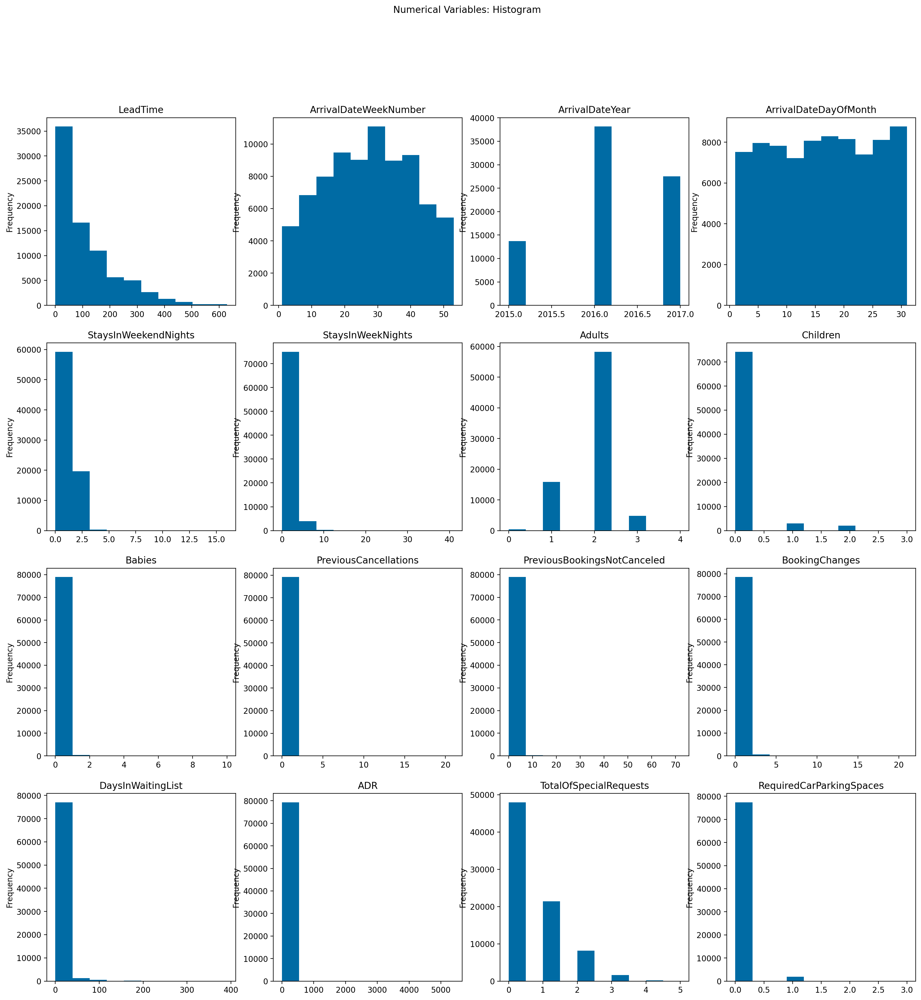

In [12]:
#Prepare figure. Create individual axes where each bar plot will be placed
fig, axes = plt.subplots(4, 4, figsize=(20, 20))

# Plot data
for ax, feat in zip(axes.flatten(), metric_features): 
    df[feat].plot(kind="hist", ax=ax, title=feat, bins=10)

title = "Numerical Variables: Histogram"
plt.suptitle(title)

plt.show()

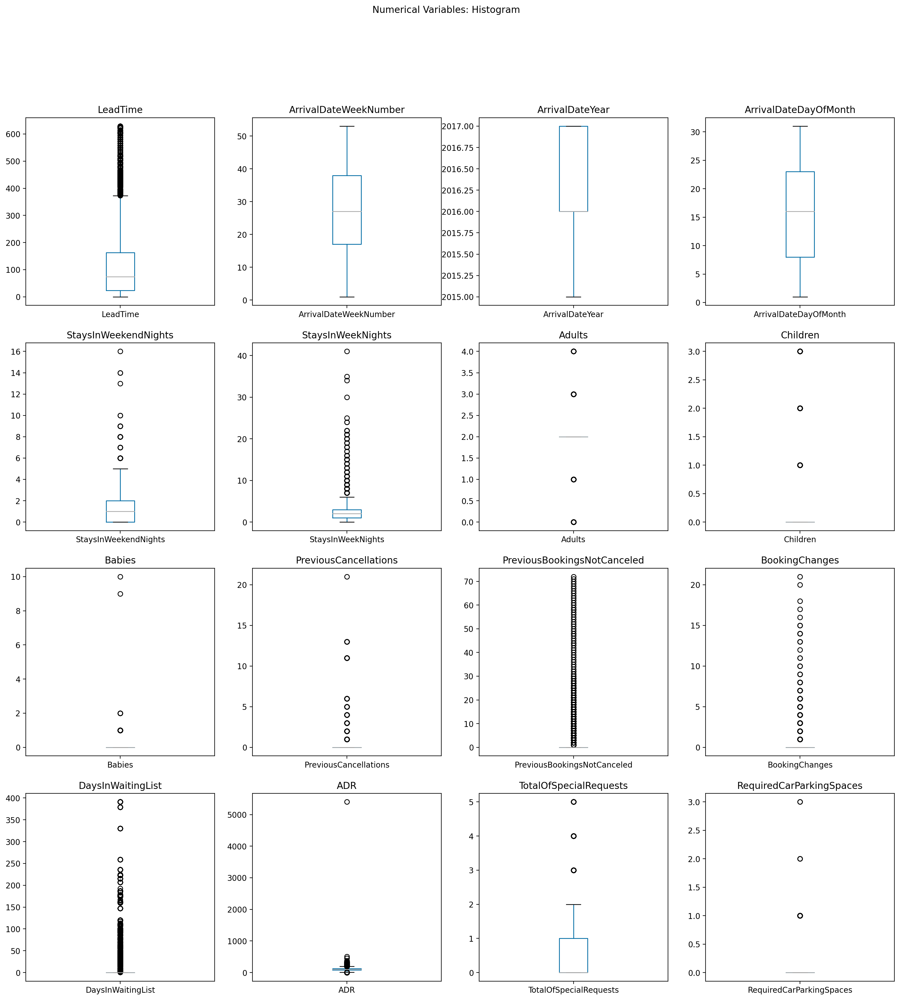

In [13]:
# Prepare figure. Create individual axes where each bar plot will be placed
fig, axes = plt.subplots(4, 4, figsize=(20, 20))

# Plot data
for ax, feat in zip(axes.flatten(), metric_features): 
    df[feat].plot(kind="box", ax=ax, title=feat)

title = "Numerical Variables: Histogram"
plt.suptitle(title)

plt.show()

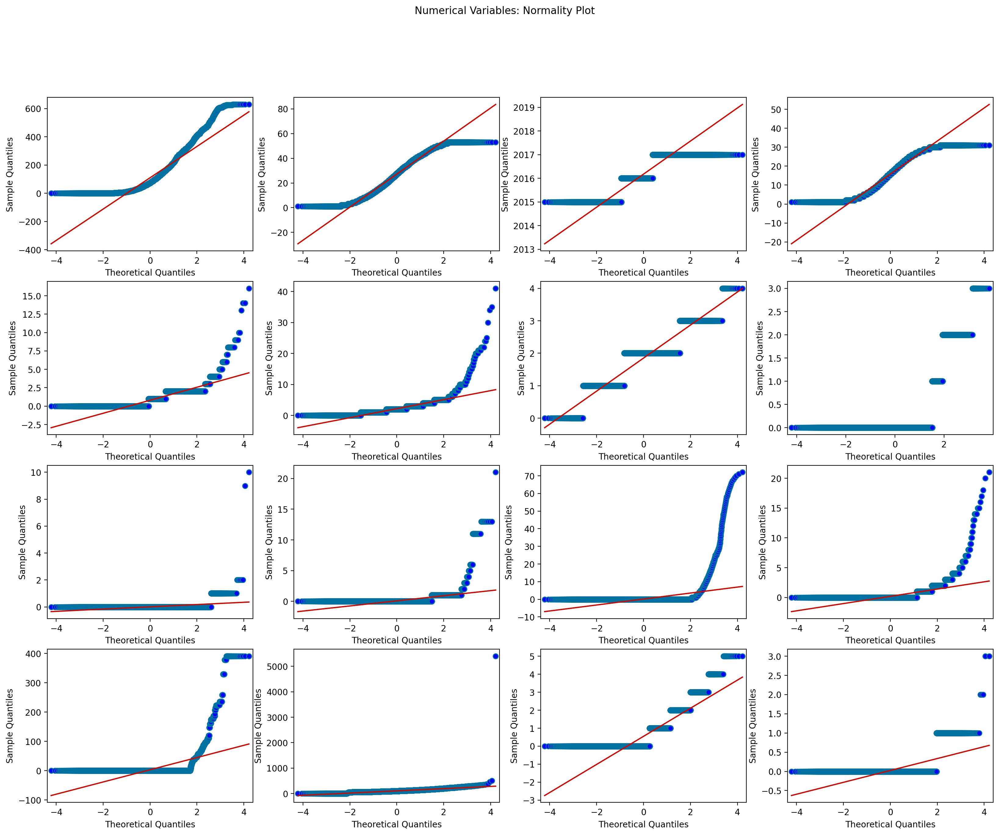

In [14]:
from statsmodels.graphics.gofplots import qqplot
from matplotlib import pyplot as plt

# Prepare figure. Create individual axes where each bar plot will be placed
fig, axes = plt.subplots(4, 4, figsize=(20, 15))

# Plot data
for ax, feat in zip(axes.flatten(), metric_features): 
    qqplot(df[feat], line="s", ax=ax)
    plt.suptitle(feat)

title = "Numerical Variables: Normality Plot"
plt.suptitle(title)

plt.show()

In [15]:
def box_plot_numerical(df, features, title):
    # Prepare figure
    fig, axes = plt.subplots(4, 4, figsize=(20, 20), constrained_layout=True)

    # Plot data
    for ax, f in zip(axes.flatten(), features):
        sns.boxplot(y=f, data=df, ax=ax, x='IsCanceled')
        ax.set_title(f)
        ax.set_ylabel('') 
        
    # Layout
    plt.suptitle(title, fontsize=16)
    plt.show()

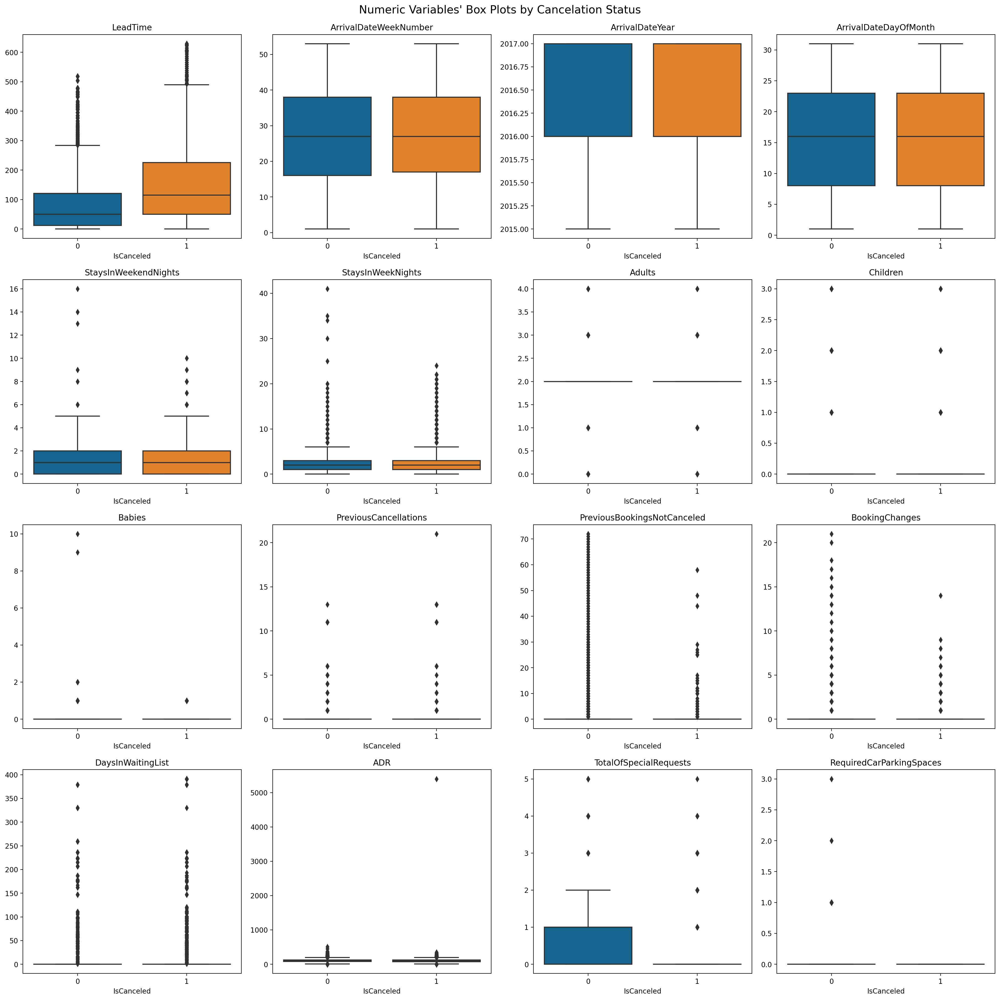

In [16]:
title = "Numeric Variables' Box Plots by Cancelation Status"

# features to plot
plot_features = metric_features

box_plot_numerical(df, plot_features, title)

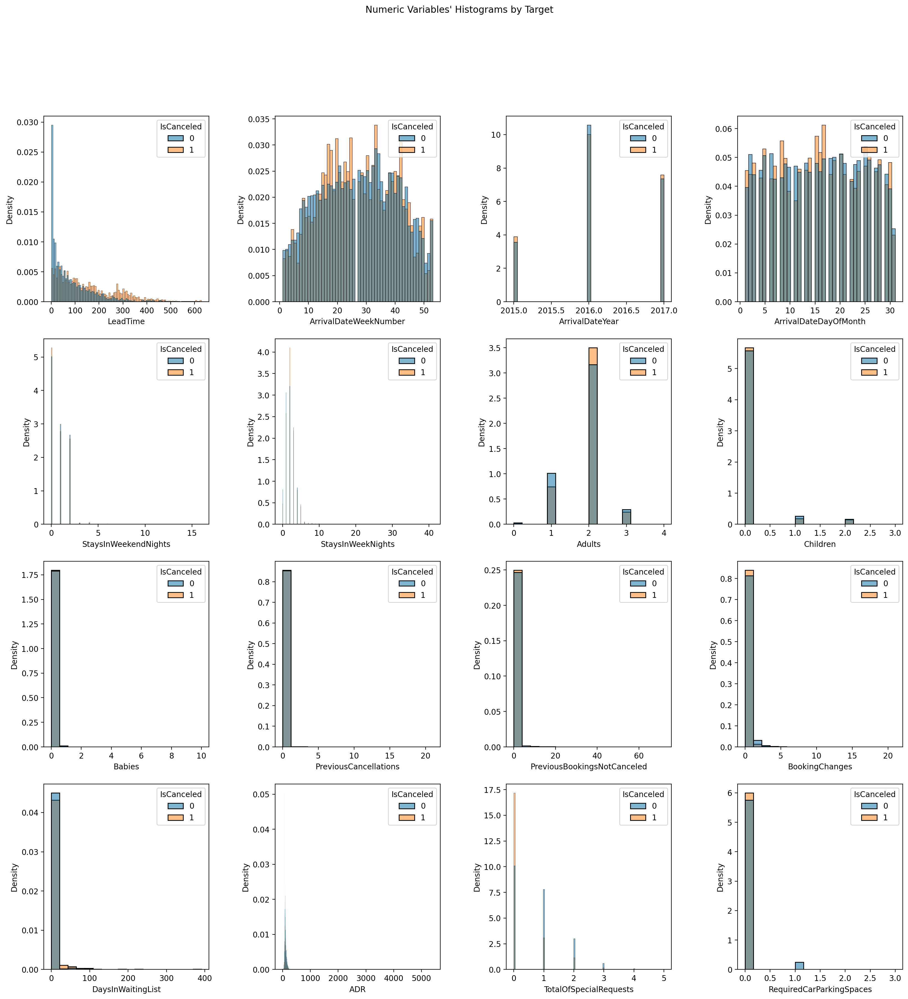

In [18]:
# All Numeric Variables' Histograms  in one figure
features = metric_features + ['IsCanceled']

# Prepare figure. Create individual axes where each box plot will be placed
fig, axes = plt.subplots(4, ceil(len(metric_features) / 4), figsize=(20,20))

# Plot data
# Iterate across axes objects and associate each histogram:
for ax, feat in zip(axes.flatten(), features):
    sns.histplot(x=df[feat], hue=df['IsCanceled'], stat='density', common_norm=False, ax=ax)
    
# Layout
# Add a centered title to the figure:
title = "Numeric Variables' Histograms by Target"
plt.suptitle(title)
plt.subplots_adjust(wspace=0.4)

plt.show()


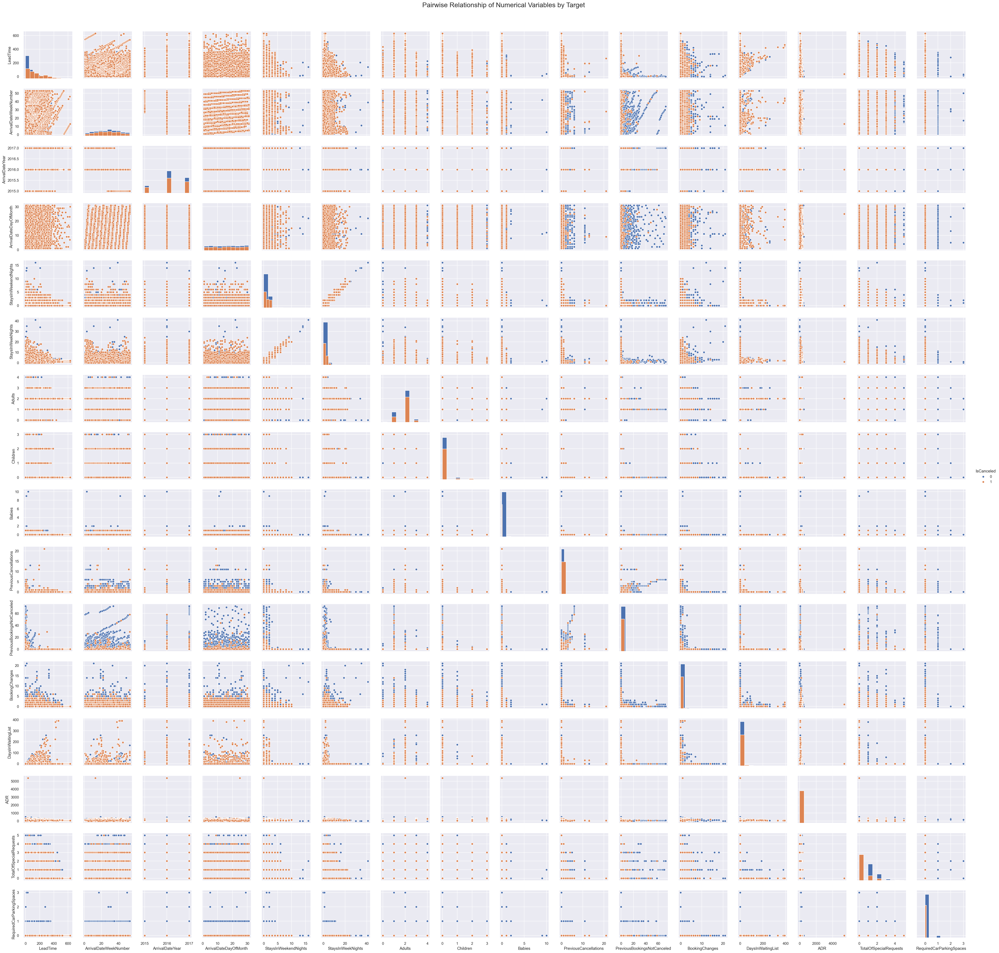

In [48]:
# Pairwise Relationship of Numerical Variables
sns.set()
features = metric_features + ['IsCanceled']

# Setting pairplot
sns.pairplot(data=df[features], hue='IsCanceled', diag_kind="hist")

# Layout
plt.subplots_adjust(top=0.95)
plt.suptitle("Pairwise Relationship of Numerical Variables by Target", fontsize=20)

plt.show()

In [25]:
def categorical_cardinality_plot(df, features, title):
    # figure and axes
    fig, axes = plt.subplots(9, 2, figsize=(23,50))

    # plot data
    for ax, feat in zip(axes.flatten(), features): 
        data = pd.DataFrame(df[feat].value_counts()/len(df[feat]))
        data["% with IsCanceled=1"] = df.groupby(feat)["IsCanceled"].mean()
        data.rename(columns={feat:"Relative Frequency"}, inplace=True)
        data.sort_values("% with IsCanceled=1").plot(kind="barh", ax=ax, title=feat)
        ax.get_legend().remove()

    # Set legend (Income)
    handles, _ = axes[0, 0].get_legend_handles_labels()
    fig.legend(handles, ["Relative Frequency", "% IsCanceled - 1"], loc=(0.05,0.91), fontsize=16)

    plt.subplots_adjust(wspace=0.35)
    plt.suptitle(title, y=0.95, fontsize=20)

    plt.show()

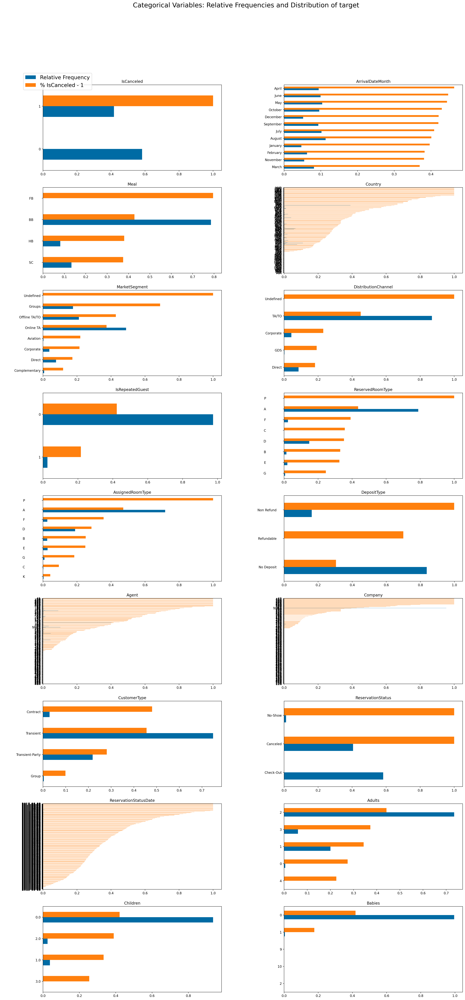

In [26]:
title = "Categorical Variables: Relative Frequencies and Distribution of target"
# data to plot

categorical_cardinality_plot(df, non_metric_features+ordinal_features, title)

<hr>
<a class="anchor" id="3.">
    
# 3. Initital notes based on data exploration
    
</a>



### Non-metric variables
- ArrivalDateMonth --> Probably drop and keep week number (redundant)
- Meal --> Potential Drop, only FB seems to matter for cancelation and only 44 booking are FB
- Country --> Seems important but could have collection issues (verify)
- MarketSegment --> Keep, seems to matter a lot
- DistributionChannel --> Drop, redundant with market segment but less useful information
- IsRepeatedGuest --> *drop due to redundancy with number of past booking canceled or not -- otherwise keep, seems that repeated guests are less likely to cancel
- ReservedRoomType --> Potential drop
- DepositType --> Drop (quality issues)
- Agent --> Investigate further, sees interesting but correlated with other variables
- Company --> Probably drop (redundant)
- CustomerType --> Keep 
- ReservationStatus --> Drop (use to find out when it was canceled)
- ReservationStatusDate --> Drop (use to find out when it was canceled)

### Metric variables
- LeadTime --> Keep, booking made very much in advance seem to be more likely to be canceled
- ArrivalDateWeekNumber --> Keep, seems that weekly patterns provide useful info
- ArrivalDateYear --> Drop
- RequiredCarParkingSpaces --> Keep, seems that people are less likely to cancel if require parking
- ArrivalDateDayOfMonth --> Not sure yet, but probably not relevant
- StaysInWeekendNights --> Potentially merge to create 'NumberOfNights'
- StaysInWeekNights --> Potentially merge to create 'NumberOfNights'
- Adults --> Investigate Further, Probably drop
- Children --> Investigate further, Probably keep
- Babies --> Keep
- PreviousCancellations --> Keep, if they canceled before they are more likely to cancel again
- PreviousBookingsNotCanceled --> Keep, if they have 1 booking not canceled they are less likely to cancel
- BookingChanges --> Keep, if they made changes they are less likely to cancel
- DaysInWaitingList --> drop
- ADR --> drop
- TotalOfSpecialRequests --> Keep

<hr>
<a class="anchor" id="4.">
    
# 4.  Data Cleaning
    
</a>



<hr>
<a class="anchor" id="4.1.">
    
# 4.1. Data quality and sense checks
    
</a>

Text(0.5, 1.0, 'CancelationRate for top15 Source Markets')

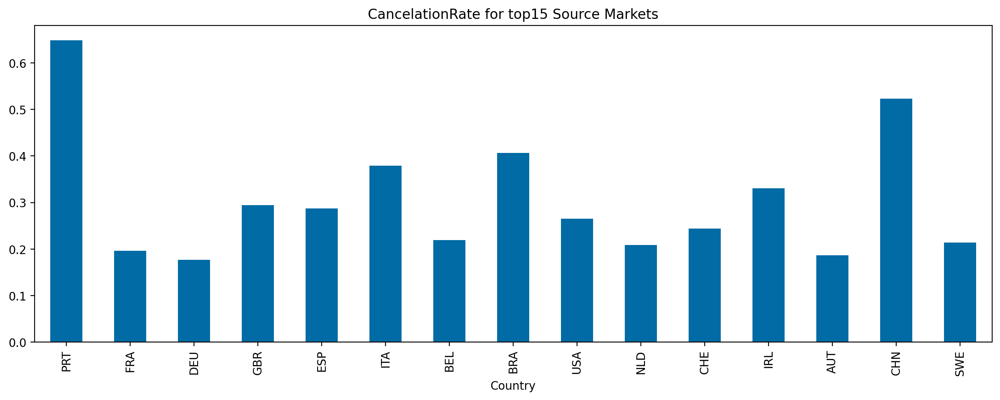

In [27]:
#We will keep Country even if it is not collected correctly it seems to have good prediction power
df.groupby('Country')['IsCanceled'].mean().loc[df['Country'].value_counts()[:15].index.tolist()].plot(kind='bar', 
                                                                                                      figsize=(15, 5))
plt.title('CancelationRate for top15 Source Markets')

<AxesSubplot:xlabel='DepositType'>

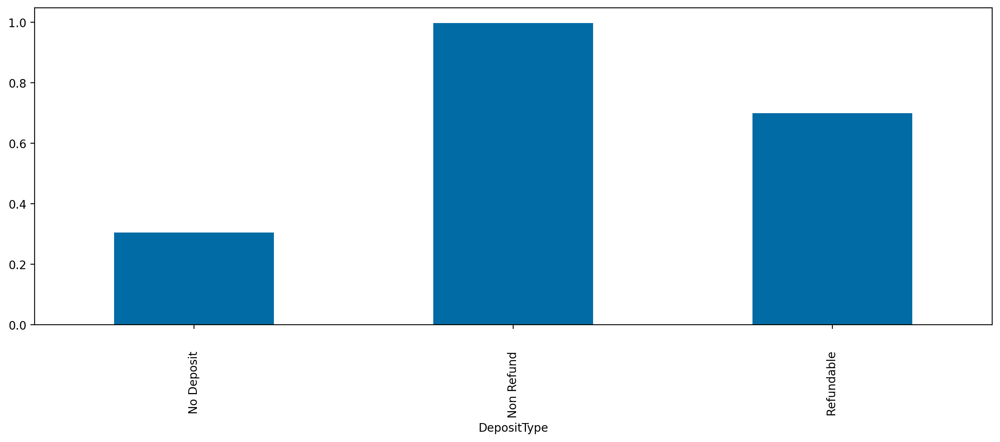

In [28]:
df.groupby('DepositType')['IsCanceled'].mean().plot(kind='bar', figsize=(15, 5))

In [29]:
#DepositType seems to have issues as all rows with 'No-refund' correspond to cancelations
df.drop(columns='DepositType', inplace=True)

In [30]:
##Drop booking with no PAX included as these are not room reservations and are not relevant for the model
df['TotalGuests'] = df['Adults'] + df['Children'] + df['Babies']
df.drop(index=df[df['TotalGuests']==0].index, inplace=True)

In [31]:
#ReservationStatusDate and ReservationStatus will be dropped later after extracting Cancelation time information 

<hr>
<a class="anchor" id="4.1.">
    
# 4.2. Missing Values
    
</a>

In [32]:
#Set missing values to mode 
df['Children'] = df['Children'].fillna(0)
df['Country'] = df['Country'].fillna(df['Country'].mode)
df['TotalGuests'] = df['Adults'] + df['Children'] + df['Babies']

In [34]:
#Company will not be used almost all values are missing
df['Company'].value_counts()

       NULL    75497
         40      921
         67      267
         45      249
        153      213
               ...  
        278        1
        224        1
        110        1
        356        1
        486        1
Name: Company, Length: 204, dtype: int64

In [35]:
#Agent will be kept as it seems to contain useful information (NULL seems to indicate no agent)
df['Agent'].value_counts()

          9    31916
       NULL     8080
          1     7133
         14     3633
          7     3532
               ...  
        256        1
        250        1
        270        1
        480        1
        453        1
Name: Agent, Length: 224, dtype: int64

Text(0.5, 1.0, 'CancelationRate for top15 Agents')

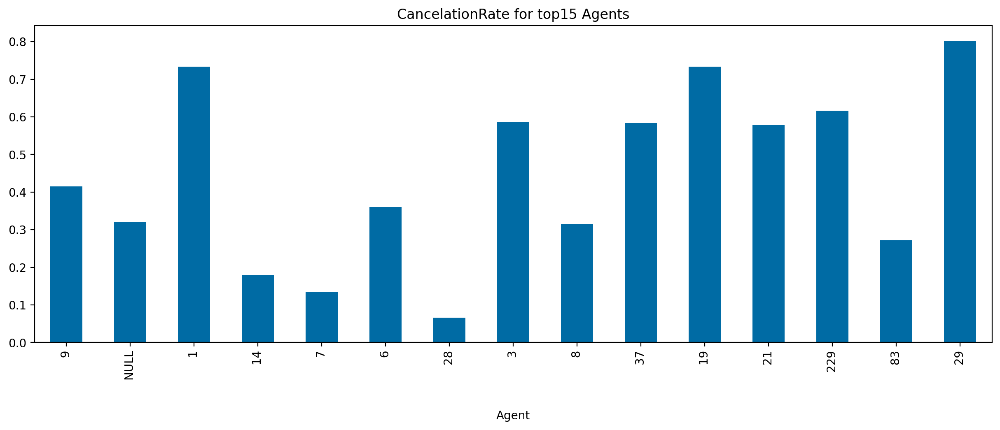

In [36]:
df.groupby('Agent')['IsCanceled'].mean().loc[df['Agent'].value_counts()[:15].index.tolist()].plot(kind='bar', 
                                                                                                      figsize=(15, 5))
plt.title('CancelationRate for top15 Agents')

In [37]:
df.isna().sum().sort_values()

IsCanceled                     0
ReservationStatus              0
TotalOfSpecialRequests         0
RequiredCarParkingSpaces       0
ADR                            0
CustomerType                   0
DaysInWaitingList              0
Company                        0
Agent                          0
BookingChanges                 0
AssignedRoomType               0
ReservedRoomType               0
PreviousBookingsNotCanceled    0
PreviousCancellations          0
ReservationStatusDate          0
IsRepeatedGuest                0
MarketSegment                  0
Country                        0
Meal                           0
Babies                         0
Children                       0
Adults                         0
StaysInWeekNights              0
StaysInWeekendNights           0
ArrivalDateDayOfMonth          0
ArrivalDateWeekNumber          0
ArrivalDateMonth               0
ArrivalDateYear                0
LeadTime                       0
DistributionChannel            0
TotalGuest

<hr>
<a class="anchor" id="4.2.">
    
# 4.3. Remove Outliers
    
</a>




### Handling Multivariate Outliers with DBScan

In [39]:
#Applying StandardScaler before using DBScan to identify outliers
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
metric_features_scaled = scaler.fit_transform(df[metric_features])
data_scaled = pd.DataFrame(metric_features_scaled, 
                           columns=df[metric_features].columns)

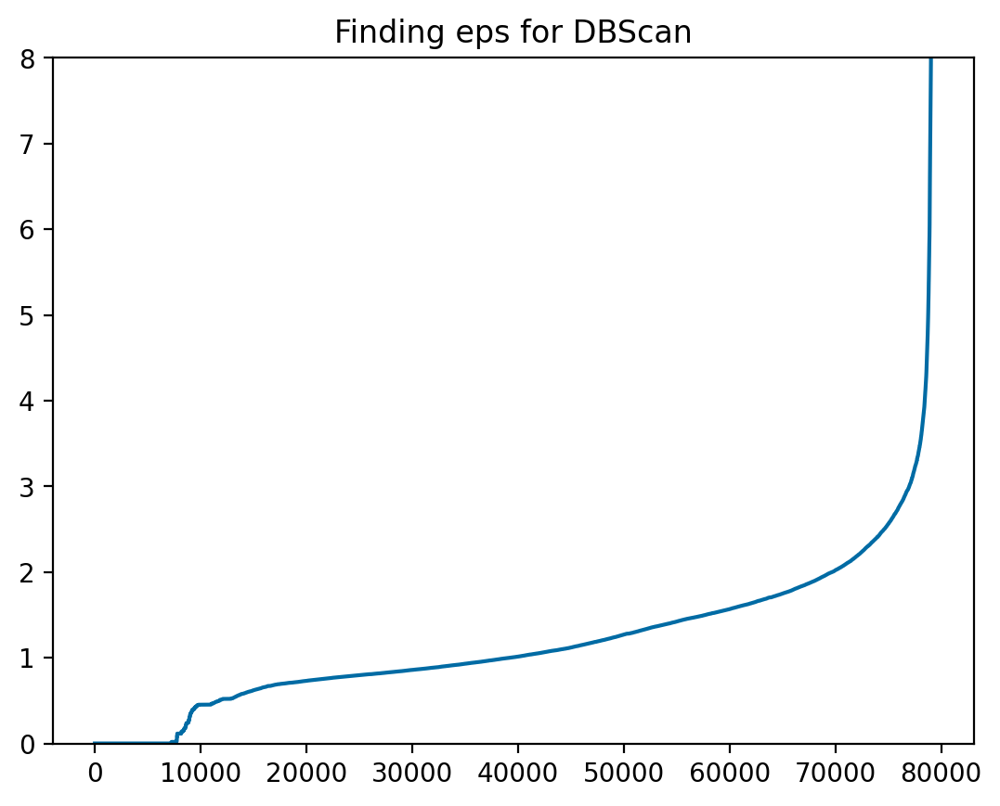

In [40]:
# K-distance graph to find out the right eps value

neigh = NearestNeighbors(n_neighbors=32)
neigh.fit(data_scaled)
distances, _ = neigh.kneighbors(data_scaled)
distances = np.sort(distances[:, -1])
plt.plot(distances)
plt.ylim(0,8)
plt.title('Finding eps for DBScan')
plt.show()

In [42]:
# Perform DBSCAN clustering
dbscan = DBSCAN(eps=4, min_samples=32, n_jobs=-1)
dbscan_labels = dbscan.fit_predict(data_scaled)

In [43]:
#add outlier labels to data
data_test = pd.concat([df,pd.DataFrame(dbscan_labels)], axis=1)
data_test.rename(columns={0:'outlier_label'}, inplace=True)

#check the % of outliers
round(len(data_test[data_test['outlier_label']==-1])/len(data_test), 7)

0.0047764

In [44]:
data_outliers = data_test[data_test['outlier_label']==-1]


In [45]:
#Keep data clean of outliers
df = data_test[data_test['outlier_label']!=-1]

### Final univariate outliers visual check 

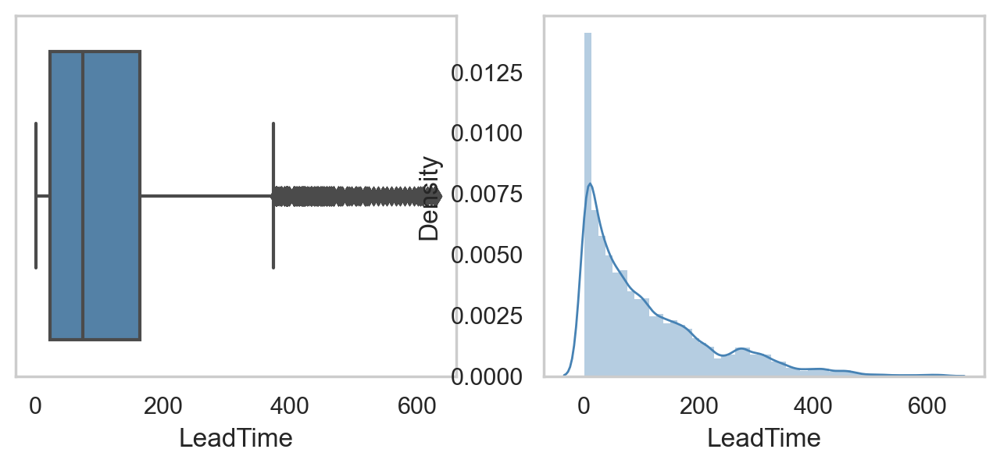

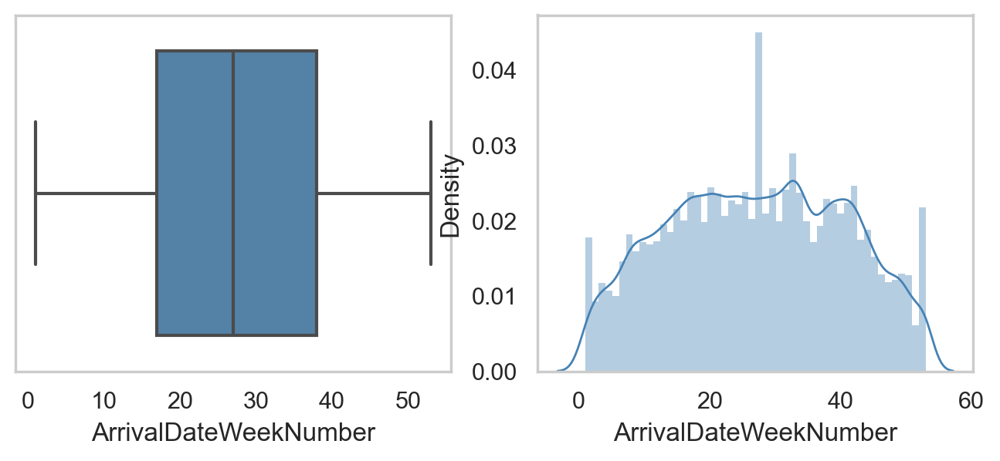

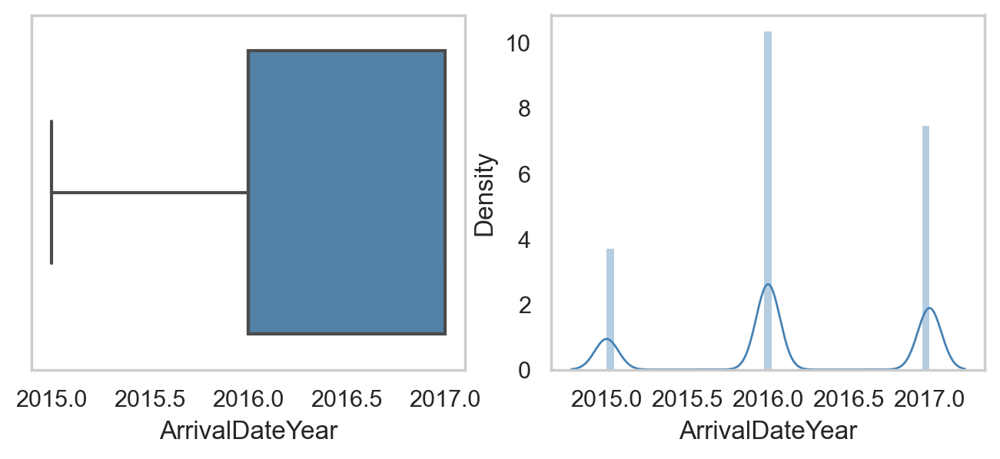

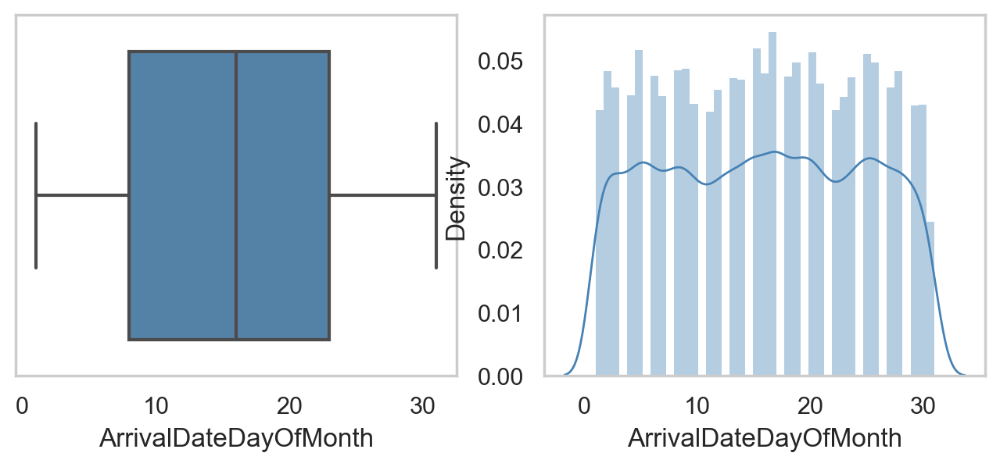

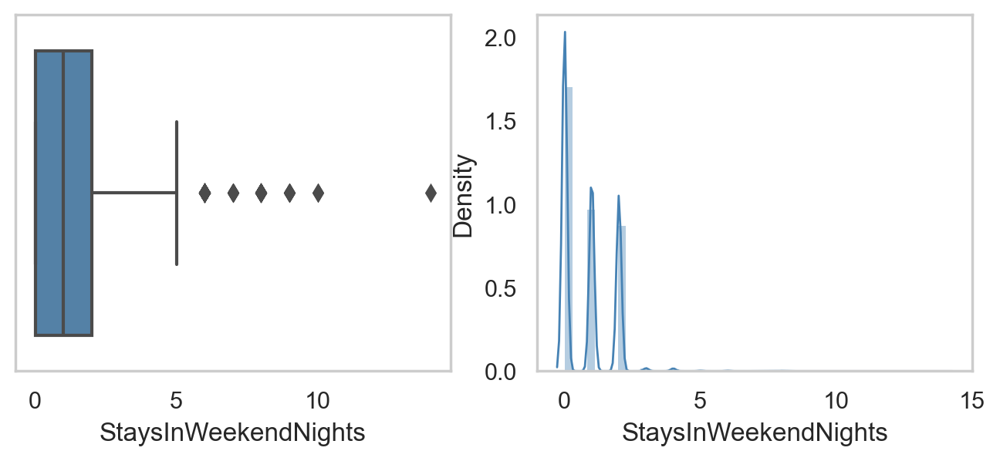

...

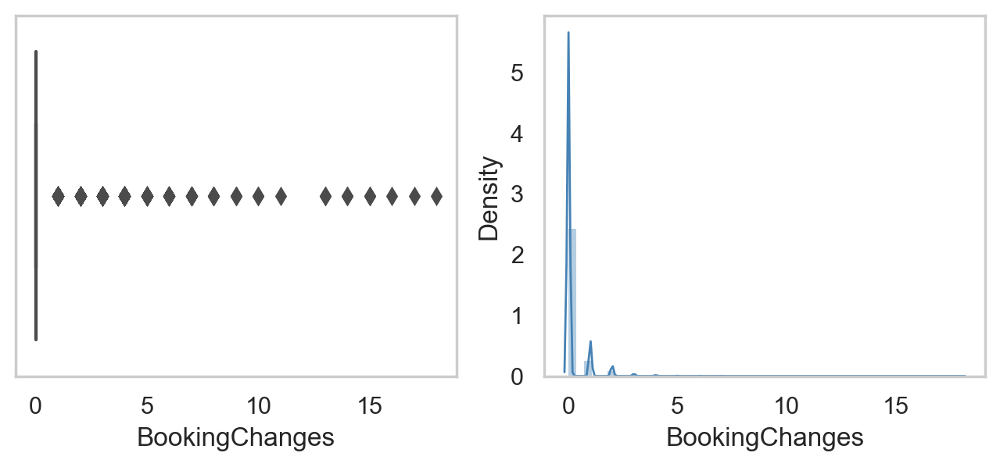

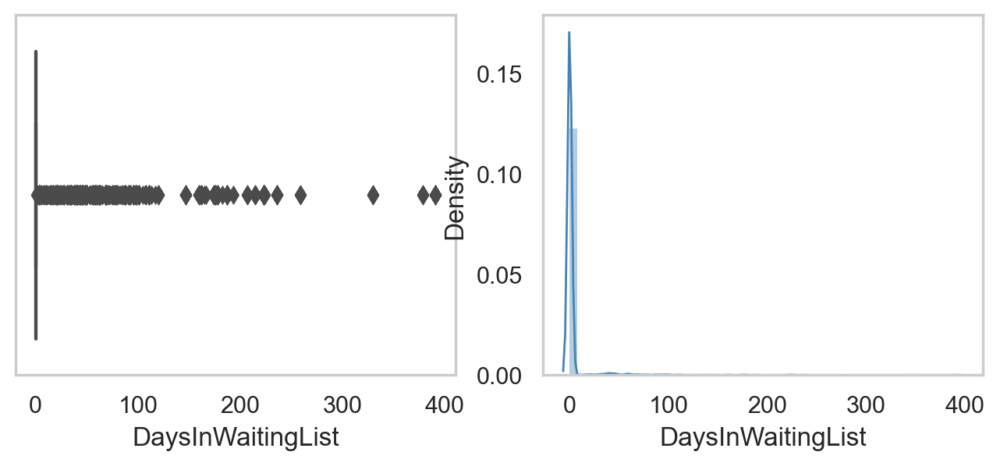

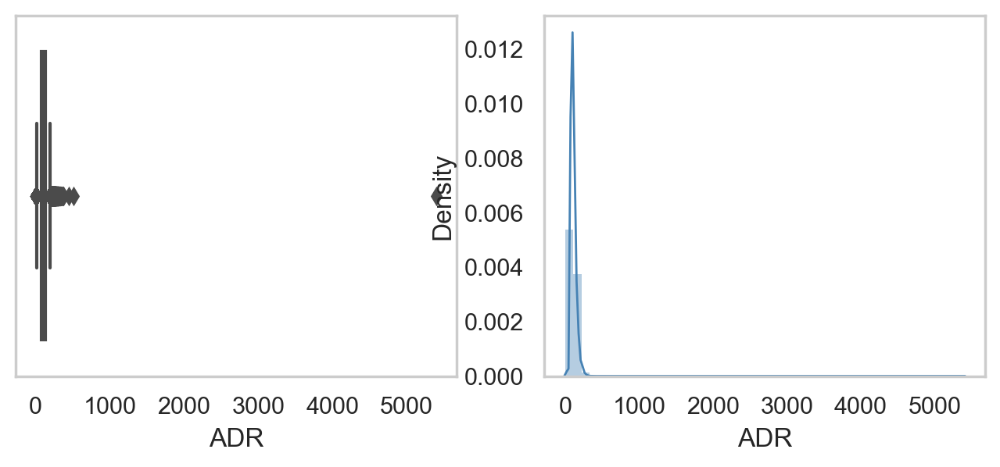

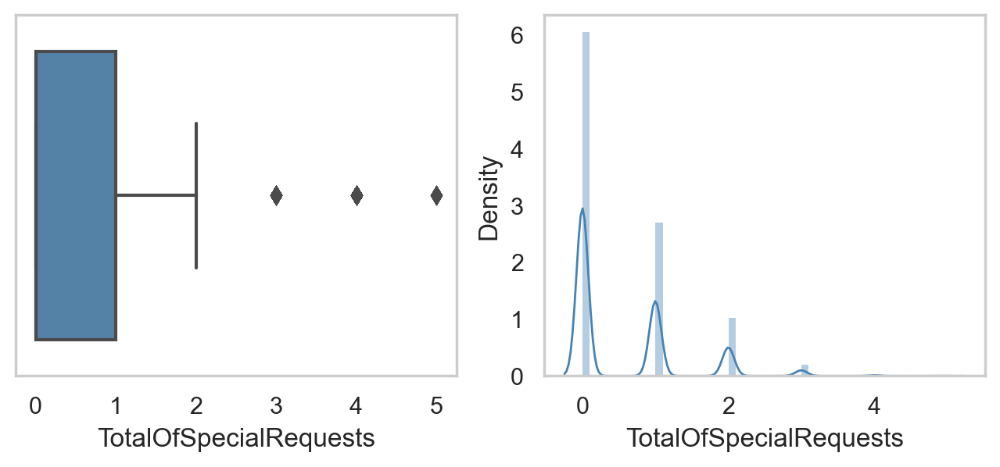

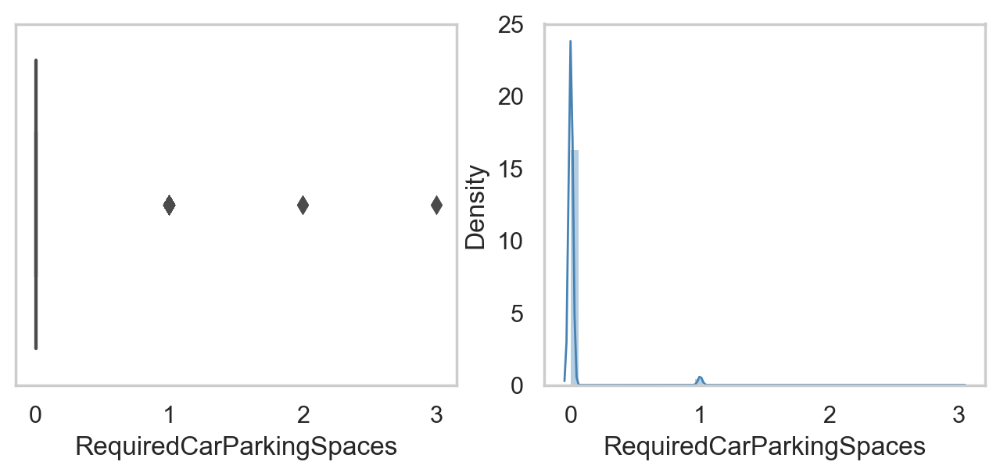

In [46]:
#Creating a function to plot Box plot and Histogram
def hist_box_plot(df,feature, fig_num):
    sns.set(color_codes = 'Blue', style="whitegrid")
    sns.set_style("whitegrid", {'axes.grid' : False})
    sns.set_context(rc = {'patch.linewidth': 0.0})
    fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(8,3))
    filtered = df.loc[~np.isnan(df[feature]), feature]
    sns.boxplot(filtered, ax = ax1, color = 'steelblue') # boxplot
    sns.distplot(filtered, kde=True, hist=True, kde_kws={'linewidth': 1}, color = 'steelblue', ax = ax2) # histogram
    plt.show()
    
#This helps identify any possible outliers, visualy, applied only to the numeric variables
fig_num = 1        
for col in metric_features:
    hist_box_plot(df,col, fig_num)
    fig_num = fig_num + 1

In [47]:
df_original=df.copy()
filters1 = (
    (df['StaysInWeekendNights']<=15)
    &
    (df['StaysInWeekNights']<=30)
    &
    (df['Babies']<=8)
    &
    (df['ADR']<=1000)
)

In [50]:
data_1 = df[filters1]
print('Percentage of data kept after removing univariate outliers:', np.round(data_1.shape[0] / df_original.shape[0], 4)*100, '%')

Percentage of data kept after removing univariate outliers: 99.99 %


In [51]:
df = data_1.copy()

# Data Construction

In [52]:
#Adding variables for stay duration and total revenue
df['NumberOfNights'] = df['StaysInWeekendNights'] + df['StaysInWeekNights']
df['TotalRevenue'] = df['ADR']*df['NumberOfNights']

In [53]:
df.isna().sum()

IsCanceled                     0
LeadTime                       0
ArrivalDateYear                0
ArrivalDateMonth               0
ArrivalDateWeekNumber          0
ArrivalDateDayOfMonth          0
StaysInWeekendNights           0
StaysInWeekNights              0
Adults                         0
Children                       0
Babies                         0
Meal                           0
Country                        0
MarketSegment                  0
DistributionChannel            0
IsRepeatedGuest                0
PreviousCancellations          0
PreviousBookingsNotCanceled    0
ReservedRoomType               0
AssignedRoomType               0
BookingChanges                 0
Agent                          0
Company                        0
DaysInWaitingList              0
CustomerType                   0
ADR                            0
RequiredCarParkingSpaces       0
TotalOfSpecialRequests         0
ReservationStatus              0
ReservationStatusDate          0
TotalGuest

<hr>
<a class="anchor" id="5.">
    
# 5. Feature Selection
    
</a>

<hr>
<a class="anchor" id="5.1.">
    
# 5.1. Principal Component Analysis
    
</a>


In [54]:
#PCA to verify which variables are correlated with the principal components that explain most of the variance

from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
metric_features_scaled = scaler.fit_transform(df[metric_features])
data_scaled = pd.DataFrame(metric_features_scaled, 
                           columns=df[metric_features].columns)

#PCA to verify which variables are correlated with the principal components that explain most of the variance
df_pca = data_scaled[metric_features].copy()

pca = PCA()
pca_feat = pca.fit_transform(df_pca)
pca_feat

array([[ 2.65922245,  0.89390738,  0.00418707, ...,  0.84347696,
        -0.77910018,  0.09125985],
       [ 0.73116131, -0.6159931 ,  0.09959268, ...,  0.82546501,
        -0.55551378, -0.71393635],
       [ 1.28750654,  0.09495111,  0.32260949, ...,  0.46384871,
         0.15094051, -0.85253368],
       ...,
       [-3.14182148, -1.22424093,  1.16311926, ...,  0.01536731,
         1.27038111,  0.20347207],
       [-0.71406516, -0.75446064, -0.86376092, ..., -0.66148125,
         0.03358419,  0.98919432],
       [-2.17358999, -1.59616911, -0.37284243, ..., -0.64659589,
         0.89246673,  0.04872473]])

In [55]:
# Obtaining the projected observations on the principal components axes (linear combinations)
pd.DataFrame(df_pca.values @ pca.components_.T, 
             index=df_pca.index,
             columns=[f"PC{i}" for i in range(pca.n_components_)])

,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15
0,2.659222,0.893907,0.004187,-1.807557,1.373652,-0.567945,0.267011,1.556809,-0.217335,-0.476088,0.463715,-0.766945,-0.243759,0.843477,-0.779100,0.091260
1,0.731161,-0.615993,0.099593,-0.048499,0.759826,-0.805524,0.936641,1.472489,-0.239046,0.170035,0.792920,-1.360947,0.357325,0.825465,-0.555514,-0.713936
2,1.287507,0.094951,0.322609,-0.827392,1.353639,-0.393252,0.202394,1.691070,-0.281605,-0.241501,1.034253,-1.757928,-0.299034,0.463849,0.150941,-0.852534
3,-0.031228,-1.120087,0.417881,0.777953,2.049266,-1.121709,0.881903,1.117899,-0.551962,-0.177305,1.160014,-0.160697,-0.833577,0.891326,-0.272723,-0.885539
4,0.981400,-0.359393,0.257349,-0.541307,0.133734,-0.884870,1.143551,1.276552,-0.009016,0.339225,0.632056,-0.465248,-0.081208,0.752001,-0.568992,-0.750665
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
79154,-0.762583,-0.544381,-0.639960,0.829489,1.393487,-0.043716,-1.174957,-1.648601,-0.279774,-0.805207,-0.151210,-0.536376,0.827968,-0.478340,-0.057649,1.302867
79155,-3.525112,-2.098838,0.282511,2.267665,-0.170147,-0.475676,-0.119780,-1.975211,0.047512,0.255206,0.718866,-0.269521,0.754034,-0.774766,0.900508,-0.136961
79156,-3.141821,-1.224241,1.163119,1.561044,1.139990,-0.164917,0.120988,-2.241663,-0.190246,0.143650,2.459379,-1.050531,-1.521229,0.015367,1.270381,0.203472
79157,-0.714065,-0.754461,-0.863761,1.135662,1.127269,0.173531,-1.184829,-1.680098,-0.251251,-0.653426,-0.441323,-0.610695,0.519583,-0.661481,0.033584,0.989194


In [56]:
# Output PCA table
pca_table =pd.DataFrame(
    {"Eigenvalue": pca.explained_variance_,
     "Difference": np.insert(np.diff(pca.explained_variance_), 0, 0),
     "Proportion": pca.explained_variance_ratio_,
     "Cumulative": np.cumsum(pca.explained_variance_ratio_)},
    index=range(1, pca.n_components_ + 1)
)
pca_table

,Eigenvalue,Difference,Proportion,Cumulative
1,1.996078,0.000000,0.124753,0.124753
2,1.450956,-0.545122,0.090684,0.215437
3,1.406997,-0.043959,0.087936,0.303373
4,1.251684,-0.155313,0.078229,0.381602
5,1.136940,-0.114744,0.071058,0.452660
6,1.089570,-0.047370,0.068097,0.520757
7,1.025179,-0.064391,0.064073,0.584830
8,0.985369,-0.039810,0.061585,0.646415
9,0.951670,-0.033699,0.059479,0.705894
10,0.890270,-0.061400,0.055641,0.761535


The minimum number of PCA to obtain at least 0.6 variance explained is:  7


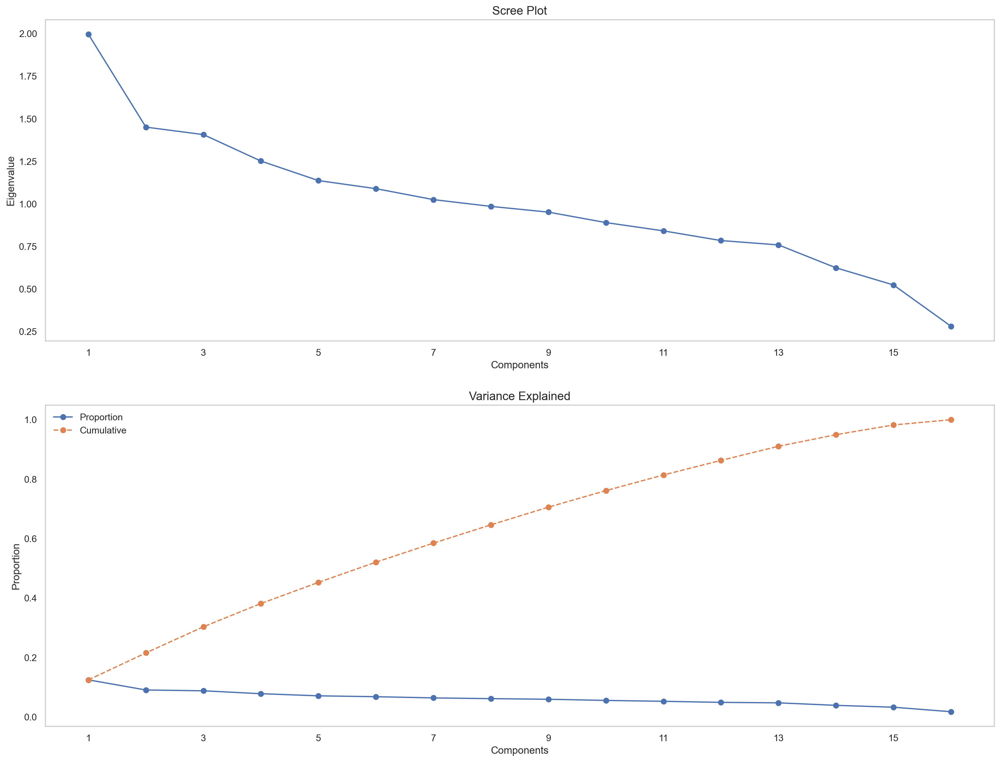

In [57]:
#figure and axes
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(20, 15))

# draw plots
ax1.plot(pca.explained_variance_, marker=".", markersize=12)
ax2.plot(pca.explained_variance_ratio_, marker=".", markersize=12, label="Proportion")
ax2.plot(np.cumsum(pca.explained_variance_ratio_), marker=".", markersize=12, linestyle="--", label="Cumulative")

# customizations
ax2.legend()
ax1.set_title("Scree Plot", fontsize=14)
ax2.set_title("Variance Explained", fontsize=14)
ax1.set_ylabel("Eigenvalue")
ax2.set_ylabel("Proportion")
ax1.set_xlabel("Components")
ax2.set_xlabel("Components")
ax1.set_xticks(range(0, pca.n_components_, 2))
ax1.set_xticklabels(range(1, pca.n_components_ + 1, 2))
ax2.set_xticks(range(0, pca.n_components_, 2))
ax2.set_xticklabels(range(1, pca.n_components_ + 1, 2))

print('The minimum number of PCA to obtain at least 0.6 variance explained is: ',len(pca_table[pca_table["Cumulative"]<0.6]))
plt.show()

In [58]:
# Perform PCA again with the number of principal components you want to retain
pca = PCA(n_components=6)
pca_feat = pca.fit_transform(df_pca)
pca_feat_names = [f"PC{i}" for i in range(pca.n_components_)]
pca_df = pd.DataFrame(pca_feat, index=df_pca.index, columns=pca_feat_names)  # remember index=df_pca.index
pca_df

,PC0,PC1,PC2,PC3,PC4,PC5
0,2.659222,0.893907,0.004187,-1.807557,1.373652,-0.567945
1,0.731161,-0.615993,0.099593,-0.048499,0.759826,-0.805524
2,1.287507,0.094951,0.322609,-0.827392,1.353639,-0.393252
3,-0.031228,-1.120087,0.417881,0.777953,2.049266,-1.121709
4,0.981400,-0.359393,0.257349,-0.541307,0.133734,-0.884870
...,...,...,...,...,...,...
79154,-0.762583,-0.544381,-0.639960,0.829489,1.393487,-0.043716
79155,-3.525112,-2.098838,0.282511,2.267665,-0.170147,-0.475676
79156,-3.141821,-1.224241,1.163119,1.561044,1.139990,-0.164917
79157,-0.714065,-0.754461,-0.863761,1.135662,1.127269,0.173531


In [59]:
# Reassigning df to contain pca variables
df_pca = pd.concat([df_pca, pca_df], axis=1)
df_pca.head()

,LeadTime,ArrivalDateWeekNumber,ArrivalDateYear,ArrivalDateDayOfMonth,StaysInWeekendNights,StaysInWeekNights,Adults,Children,Babies,PreviousCancellations,...,DaysInWaitingList,ADR,TotalOfSpecialRequests,RequiredCarParkingSpaces,PC0,PC1,PC2,PC3,PC4,PC5
0,-0.936203,-0.013115,-1.679301,-1.694163,-0.904867,-0.126307,-1.700675,-0.245777,-0.067721,-0.192006,...,-0.154705,-2.695558,-0.700506,-0.157207,2.659222,0.893907,0.004187,-1.807557,1.373652,-0.567945
1,-0.197233,-0.013115,-1.679301,-1.694163,-0.904867,1.273626,0.288681,-0.245777,-0.067721,-0.192006,...,-0.154705,-0.739810,0.580155,-0.157207,0.731161,-0.615993,0.099593,-0.048499,0.759826,-0.805524
2,-0.404505,-0.013115,-1.679301,-1.694163,-0.904867,1.273626,-1.700675,-0.245777,-0.067721,-0.192006,...,-0.154705,-0.957116,0.580155,-0.157207,1.287507,0.094951,0.322609,-0.827392,1.353639,-0.393252
3,-0.161185,-0.013115,-1.679301,-1.694163,1.374512,1.273626,0.288681,-0.245777,-0.067721,-0.192006,...,-0.154705,-0.739810,1.860816,-0.157207,-0.031228,-1.120087,0.417881,0.777953,2.049266,-1.121709
4,-0.089091,-0.013115,-1.679301,-1.579601,-0.904867,-0.126307,0.288681,-0.245777,-0.067721,-0.192006,...,-0.154705,-0.739810,0.580155,-0.157207,0.981400,-0.359393,0.257349,-0.541307,0.133734,-0.884870


In [60]:
def _color_red_or_green(val):
    if val < -0.4:
        color = 'background-color: red'
    elif val > 0.4:
        color = 'background-color: green'
    else:
        color = ''
    return color

# Interpreting each Principal Component
loadings = df_pca[df_pca.columns].corr().loc[df_pca.columns, pca_feat_names]
loadings.style.applymap(_color_red_or_green)

,PC0,PC1,PC2,PC3,PC4,PC5
LeadTime,0.272027,-0.250069,-0.405910,0.430910,-0.250812,0.264498
ArrivalDateWeekNumber,0.368980,-0.714737,0.355662,-0.080927,-0.018189,-0.047048
ArrivalDateYear,-0.618923,0.506461,-0.333918,0.174687,-0.106269,0.114990
ArrivalDateDayOfMonth,0.008128,-0.128254,0.051368,-0.032580,-0.159667,0.264429
StaysInWeekendNights,-0.222193,-0.213369,-0.030941,0.323402,0.573868,-0.135866
StaysInWeekNights,-0.230863,-0.250600,-0.160819,0.424457,0.444425,0.101233
Adults,-0.349373,-0.381375,-0.113049,0.386772,-0.255321,-0.239472
Children,-0.400316,-0.146533,0.324399,-0.005604,-0.268096,0.165362
Babies,-0.097419,-0.057776,0.206425,-0.038320,0.195428,0.415165
PreviousCancellations,0.454976,0.218419,0.361537,0.553492,-0.108288,-0.057460


<hr>
<a class="anchor" id="5.2.">
    
# 5.2. Chi-squared
    
</a>


In [61]:
# Define metric and non-metric features
metric_features = ['LeadTime','ArrivalDateWeekNumber', 'ArrivalDateYear', 'ArrivalDateDayOfMonth',
                       'StaysInWeekendNights', 'StaysInWeekNights', 'Adults', 'Children',
                       'Babies', 'PreviousCancellations', 'PreviousBookingsNotCanceled', 
                       'BookingChanges', 'DaysInWaitingList', 'ADR',
                       'TotalOfSpecialRequests', 'RequiredCarParkingSpaces', 'NumberOfNights',
                  'TotalGuests', 'TotalRevenue']

non_metric_features = df.columns.drop(metric_features).to_list()

label = preprocessing.LabelEncoder()
data_encoded = pd.DataFrame() 

for i in df[non_metric_features].columns :
  data_encoded[i]=label.fit_transform(df[non_metric_features][i].astype('str'))

data_encoded.head()

,IsCanceled,ArrivalDateMonth,Meal,Country,MarketSegment,DistributionChannel,IsRepeatedGuest,ReservedRoomType,AssignedRoomType,Agent,Company,CustomerType,ReservationStatus,ReservationStatusDate
0,0,5,2,126,5,3,0,0,0,5,203,2,1,66
1,1,5,0,126,6,3,0,0,0,8,203,2,0,64
2,1,5,0,126,6,3,0,0,0,8,203,2,0,28
3,1,5,0,126,6,3,0,0,0,8,203,2,0,58
4,1,5,0,126,6,3,0,0,0,8,203,2,0,14


In [62]:
# feature selection
sf = SelectKBest(chi2, k='all')
sf_fit1 = sf.fit(data_encoded[non_metric_features].drop(columns=['IsCanceled', 'ReservationStatusDate', 'ReservationStatus']), data_encoded['IsCanceled'])
# print feature scores
for i in range(len(sf_fit1.scores_)):
    print(' %s: %f' % (data_encoded[non_metric_features].drop(columns=['IsCanceled', 'ReservationStatusDate', 'ReservationStatus']).columns[i], sf_fit1.scores_[i]))

 ArrivalDateMonth: 2.085607
 Meal: 288.878964
 Country: 148688.229874
 MarketSegment: 0.421921
 DistributionChannel: 506.963363
 IsRepeatedGuest: 311.626642
 ReservedRoomType: 1029.012767
 AssignedRoomType: 5659.689098
 Agent: 32343.923728
 Company: 3612.831116
 CustomerType: 158.102881


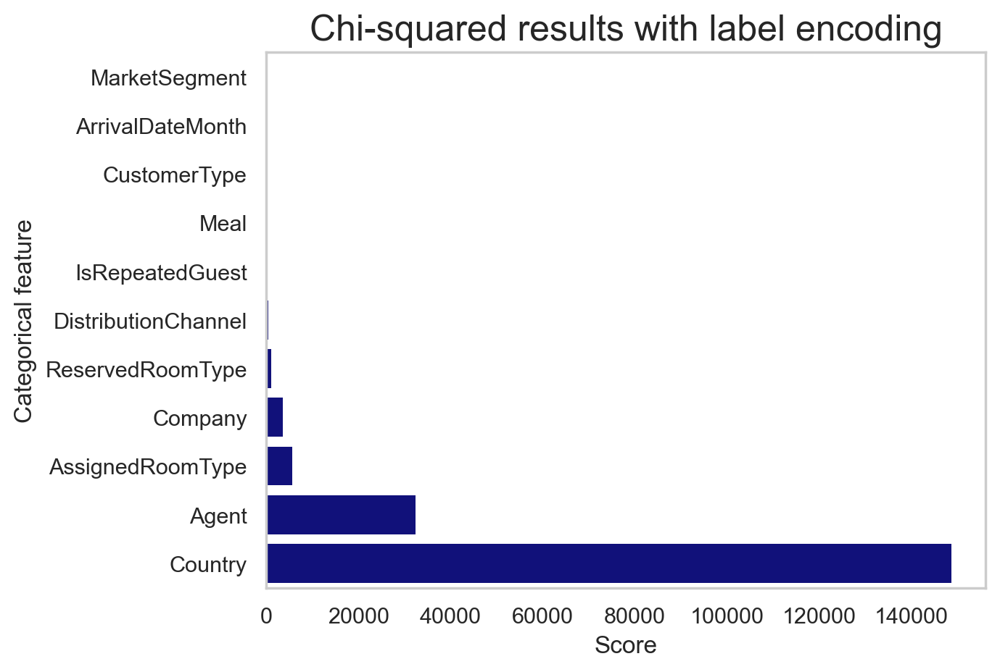

In [63]:
# plot the scores of features
datset1 = pd.DataFrame()
datset1['feature'] = data_encoded[non_metric_features].drop(columns=['IsCanceled', 'ReservationStatusDate', 'ReservationStatus']).columns[ range(len(sf_fit1.scores_))]
datset1['scores'] = sf_fit1.scores_
datset1 = datset1.sort_values(by='scores', ascending=True)
sns.barplot(datset1['scores'], datset1['feature'], color='darkblue')
sns.set_style('whitegrid')
plt.ylabel('Categorical feature', fontsize=12)
plt.xlabel('Score', fontsize=12)
plt.title('Chi-squared results with label encoding', fontsize=18)
plt.show()

<hr>
<a class="anchor" id="5.3.">
    
# 5.3. Multiple Correspondance Analysis
    
</a>


In [64]:
variables_mca = non_metric_features
data_mca = df.copy()
data_mca = pd.concat([data_mca], axis=1)
data_mca['IsCanceled'] = data_mca['IsCanceled'].apply(lambda x: 'yes' if x==1 else 'no')

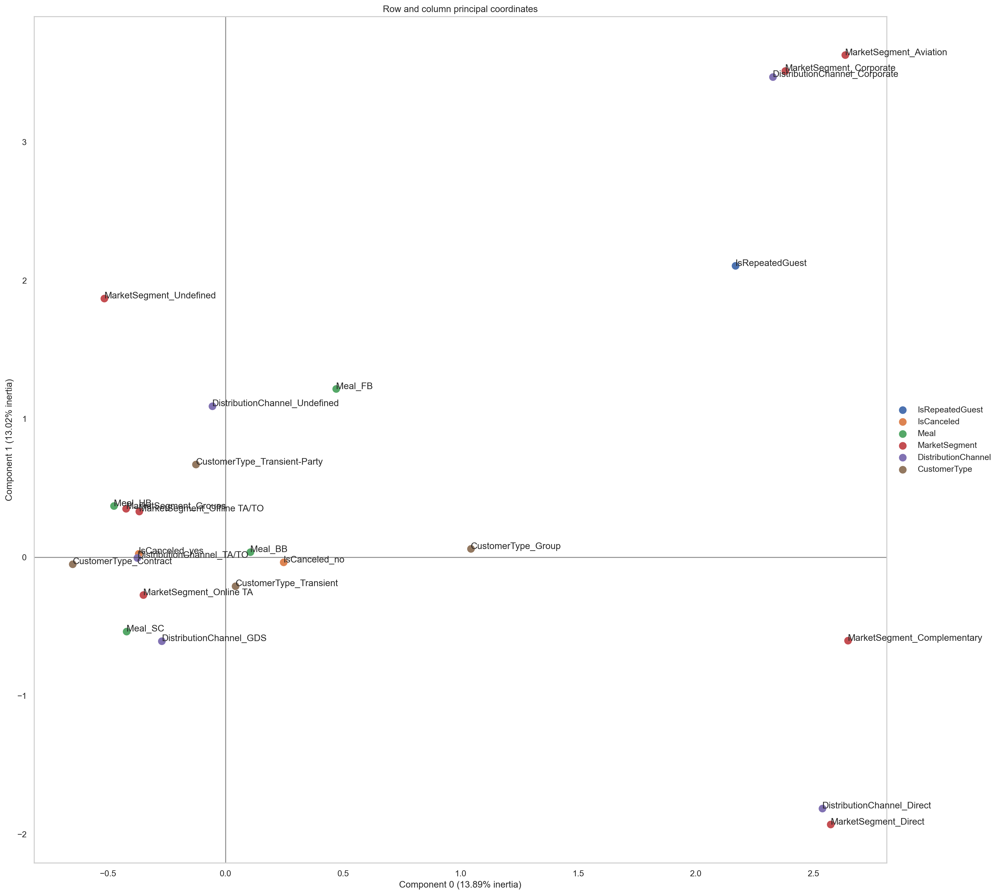

In [65]:
#Done dropping high cardinality variables
mca = prince.MCA(
        n_components=2,
        n_iter=3,
        copy=True,
        check_input=True,
        engine='auto',
        random_state=42
        )
this_mca = mca.fit(data_mca[variables_mca].drop(columns=['ReservationStatusDate', 'Agent', 'Company',
                                                        'ReservedRoomType', 'ArrivalDateMonth',
                                                        'AssignedRoomType', 'ReservationStatus', 'Country']))

ax = this_mca.plot_coordinates(
        X=data_mca[variables_mca].drop(columns=['ReservationStatusDate', 'Agent', 'Company',
                                               'ReservedRoomType', 'ArrivalDateMonth',
                                               'AssignedRoomType', 'ReservationStatus', 'Country']),
        figsize=(20, 20),
        show_row_points=False,
        row_points_size=0,
        show_row_labels=False,
        show_column_points=True,
        column_points_size=100,
        show_column_labels=True,
        legend_n_cols=1
               ).legend(loc='center left', bbox_to_anchor=(1, 0.5))

## Pearson Correlation Matrix

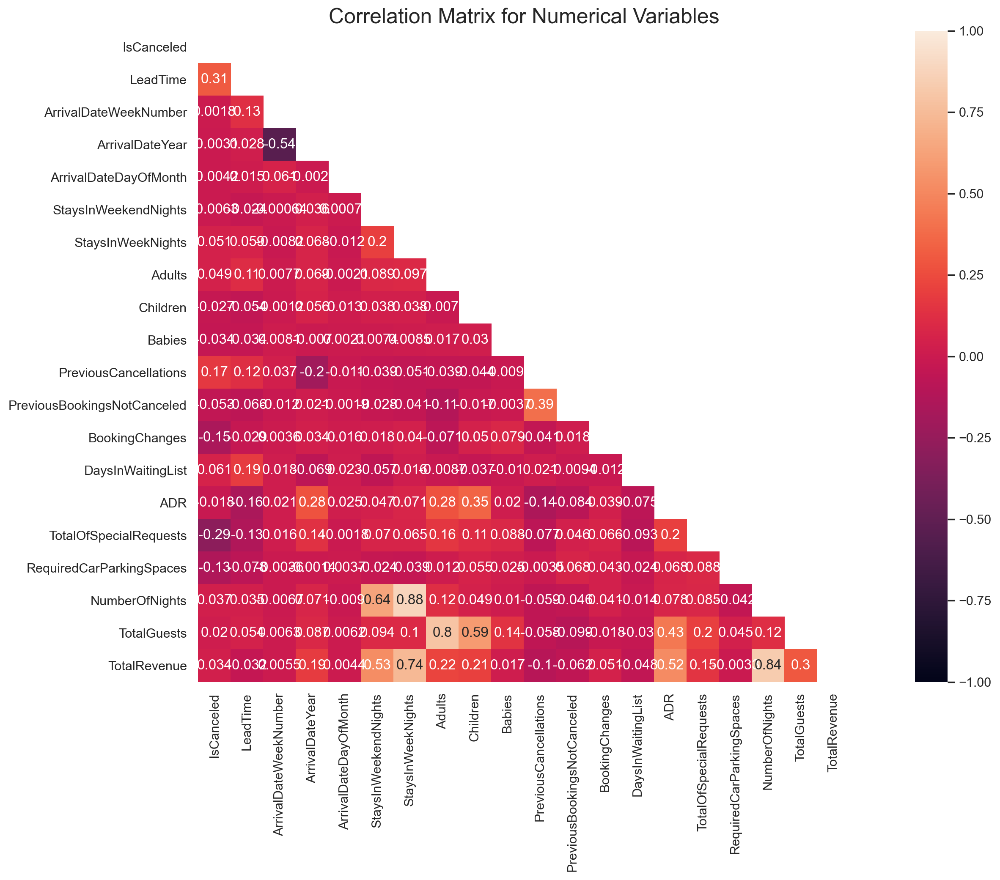

In [66]:
fig, axes = plt.subplots(1, 1, figsize=(20, 10))

mask = np.zeros_like(df[['IsCanceled'] + metric_features].corr(method="pearson"), dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

with sns.axes_style("white"):
  ax = sns.heatmap(df[['IsCanceled'] + metric_features].corr(method="pearson"),vmin=-1, vmax=1, square=True, annot=True, mask=mask)

plt.title('Correlation Matrix for Numerical Variables', fontsize=18)
plt.show()

## Phik Correlation Matrix

interval columns not set, guessing: ['IsCanceled', 'LeadTime', 'ArrivalDateYear', 'ArrivalDateWeekNumber', 'ArrivalDateDayOfMonth', 'StaysInWeekendNights', 'StaysInWeekNights', 'Adults', 'Children', 'Babies', 'IsRepeatedGuest', 'PreviousCancellations', 'PreviousBookingsNotCanceled', 'BookingChanges', 'DaysInWaitingList', 'ADR', 'RequiredCarParkingSpaces', 'TotalOfSpecialRequests', 'TotalGuests', 'NumberOfNights', 'TotalRevenue']


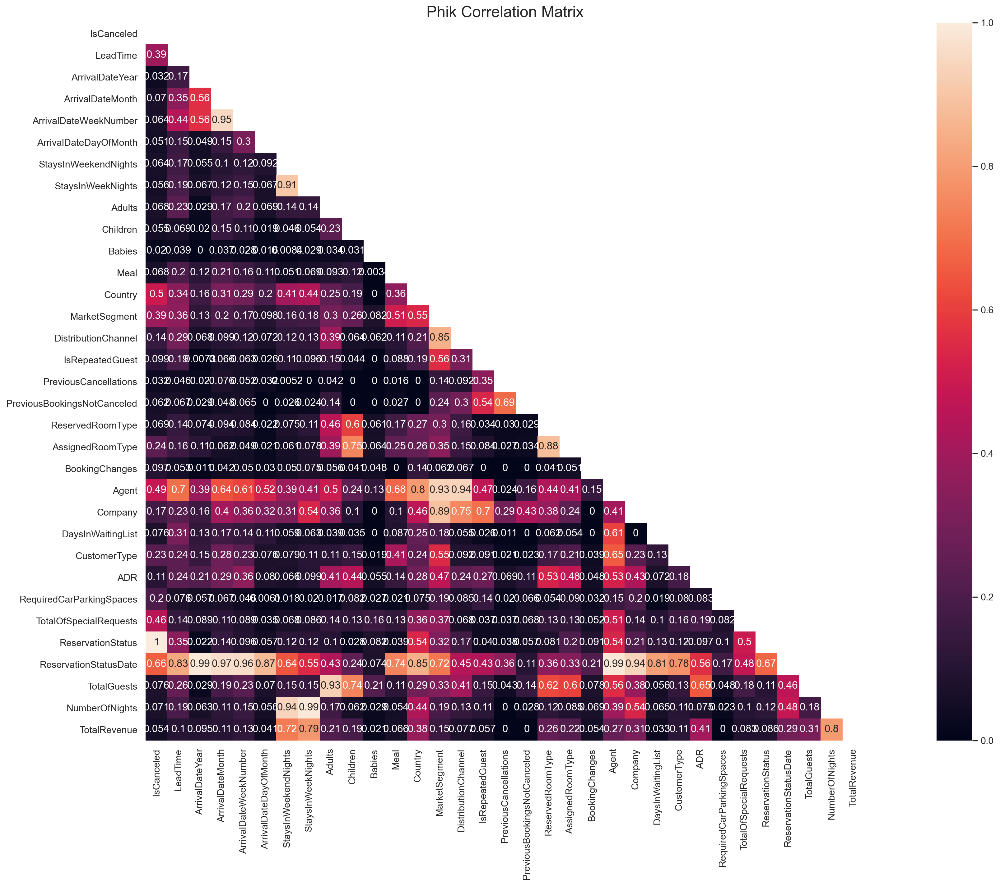

In [67]:
import phik
phik_matrix = df.phik_matrix()
fig, axes = plt.subplots(1, 1, figsize=(30, 15))

mask = np.zeros_like(phik_matrix, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

with sns.axes_style("white"):
  ax = sns.heatmap(phik_matrix,vmin=0, vmax=1, square=True, annot=True, mask=mask)

plt.title('Phik Correlation Matrix', fontsize=18)
plt.show()

In [69]:
feature_selection = ['MarketSegment', 'CustomerType',
                    'LeadTime', 'ArrivalDateWeekNumber', 'NumberOfNights', 
                    'PreviousCancellations', 'PreviousBookingsNotCanceled', 
                    'BookingChanges', 'TotalOfSpecialRequests', 'Babies', 'Agent',
                    'ReservedRoomType', 'AssignedRoomType']

selected_metric_features = ['LeadTime', 'ArrivalDateWeekNumber', 'NumberOfNights', 
                            'PreviousCancellations', 'PreviousBookingsNotCanceled', 
                            'BookingChanges', 'TotalOfSpecialRequests', 'Children', 'Babies']

selected_non_metric_features = ['MarketSegment', 'CustomerType', 'Country', 'Agent', 
                                'ReservedRoomType', 'AssignedRoomType']

<hr>
<a class="anchor" id=".">
    
# Creating variables to analyze relationship between booking date, cancelation date and arrival date
    
</a>


In [70]:
def month_to_number(x):
    month_dic = {'January': 1,
                 'February': 2,
                'March': 3,
                'April': 4,
                'May': 5,
                'June': 6,
                'July': 7,
                'August': 8,
                'September': 9,
                'October': 10,
                'November': 11,
                'December': 12}
    return month_dic[x]

def add_0(x):
    if len(x)==1:
        return '0'+x
    return x

from datetime import datetime, timedelta

def to_timedelta(x):
    return timedelta(x)

In [71]:
df_PowerBI = df.copy()
df_PowerBI['CancelationDate'] = pd.to_datetime(df_PowerBI['ReservationStatusDate'])
df_PowerBI['ArrivalDateYear'] = df_PowerBI['ArrivalDateYear'].astype('str')
df_PowerBI['ArrivalDateMonth'] = df_PowerBI['ArrivalDateMonth'].apply(month_to_number)
df_PowerBI['ArrivalDateMonth'] = df_PowerBI['ArrivalDateMonth'].astype('str')
df_PowerBI['ArrivalDateDayOfMonth'] = df_PowerBI['ArrivalDateDayOfMonth'].astype('str')
df_PowerBI['ArrivalDateMonth'] = df_PowerBI['ArrivalDateMonth'].apply(add_0)
df_PowerBI['ArrivalDateDayOfMonth'] = df_PowerBI['ArrivalDateDayOfMonth'].apply(add_0)
df_PowerBI['ArrivalDate'] = df_PowerBI['ArrivalDateYear']+'-'+df_PowerBI['ArrivalDateMonth']+'-'+df_PowerBI['ArrivalDateDayOfMonth']
df_PowerBI['ArrivalDate'] = pd.to_datetime(df_PowerBI['ArrivalDate'])
df_PowerBI['CancelationTime'] = df_PowerBI['ArrivalDate']-df_PowerBI['CancelationDate']
df_PowerBI['LeadTimeDelta'] = df_PowerBI['LeadTime'].apply(timedelta)
df_PowerBI['BookingDate'] = df_PowerBI['ArrivalDate'] - df_PowerBI['LeadTimeDelta']
df_PowerBI['BookingToCancelationTime'] = df_PowerBI['CancelationDate'] - df_PowerBI['BookingDate']
df_PowerBI['LeadTime'] = df_PowerBI['ArrivalDate'] - df_PowerBI['BookingDate']
df_PowerBI['LeadTime'] = df_PowerBI['LeadTime'].dt.days
df_PowerBI['BookingToCancelationTime'] = df_PowerBI['BookingToCancelationTime'].dt.days
df_PowerBI['CancelationTime'] = df_PowerBI['CancelationTime'].dt.days
df_PowerBI = df_PowerBI.drop(columns=['LeadTimeDelta'])

#df_PowerBI.to_csv('/Users/rui.soromenho/Downloads/BC2_HotelCancelations_PowerBI')


In [72]:
df_cancelations = df[df['IsCanceled']==1]
df_cancelations['CancelationDate'] = pd.to_datetime(df_cancelations['ReservationStatusDate'])
df_cancelations['ArrivalDateYear'] = df_cancelations['ArrivalDateYear'].astype('str')
df_cancelations['ArrivalDateMonth'] = df_cancelations['ArrivalDateMonth'].apply(month_to_number)
df_cancelations['ArrivalDateMonth'] = df_cancelations['ArrivalDateMonth'].astype('str')
df_cancelations['ArrivalDateDayOfMonth'] = df_cancelations['ArrivalDateDayOfMonth'].astype('str')
df_cancelations['ArrivalDateMonth'] = df_cancelations['ArrivalDateMonth'].apply(add_0)
df_cancelations['ArrivalDateDayOfMonth'] = df_cancelations['ArrivalDateDayOfMonth'].apply(add_0)
df_cancelations['ArrivalDate'] = df_cancelations['ArrivalDateYear']+'-'+df_cancelations['ArrivalDateMonth']+'-'+df_cancelations['ArrivalDateDayOfMonth']
df_cancelations['ArrivalDate'] = pd.to_datetime(df_cancelations['ArrivalDate'])
df_cancelations['CancelationTime'] = df_cancelations['ArrivalDate']-df_cancelations['CancelationDate']
df_cancelations['LeadTimeDelta'] = df_cancelations['LeadTime'].apply(timedelta)
df_cancelations['BookingDate'] = df_cancelations['ArrivalDate'] - df_cancelations['LeadTimeDelta']
df_cancelations['BookingToCancelationTime'] = df_cancelations['CancelationDate'] - df_cancelations['BookingDate']
df_cancelations['LeadTime'] = df_cancelations['ArrivalDate'] - df_cancelations['BookingDate']
df_cancelations['LeadTime'] = df_cancelations['LeadTime'].dt.days
df_cancelations['BookingToCancelationTime'] = df_cancelations['BookingToCancelationTime'].dt.days
df_cancelations['CancelationTime'] = df_cancelations['CancelationTime'].dt.days
df_cancelations.head()

,IsCanceled,LeadTime,ArrivalDateYear,ArrivalDateMonth,ArrivalDateWeekNumber,ArrivalDateDayOfMonth,StaysInWeekendNights,StaysInWeekNights,Adults,Children,...,ReservationStatusDate,TotalGuests,NumberOfNights,TotalRevenue,CancelationDate,ArrivalDate,CancelationTime,LeadTimeDelta,BookingDate,BookingToCancelationTime
1,1,88,2015,07,27,01,0,4,2,0.0,...,2015-07-01,2.0,4,306.0,2015-07-01,2015-07-01,0,88 days,2015-04-04,88
2,1,65,2015,07,27,01,0,4,1,0.0,...,2015-04-30,1.0,4,272.0,2015-04-30,2015-07-01,62,65 days,2015-04-27,3
3,1,92,2015,07,27,01,2,4,2,0.0,...,2015-06-23,2.0,6,459.0,2015-06-23,2015-07-01,8,92 days,2015-03-31,84
4,1,100,2015,07,27,02,0,2,2,0.0,...,2015-04-02,2.0,2,153.0,2015-04-02,2015-07-02,91,100 days,2015-03-24,9
5,1,79,2015,07,27,02,0,3,2,0.0,...,2015-06-25,2.0,3,229.5,2015-06-25,2015-07-02,7,79 days,2015-04-14,72


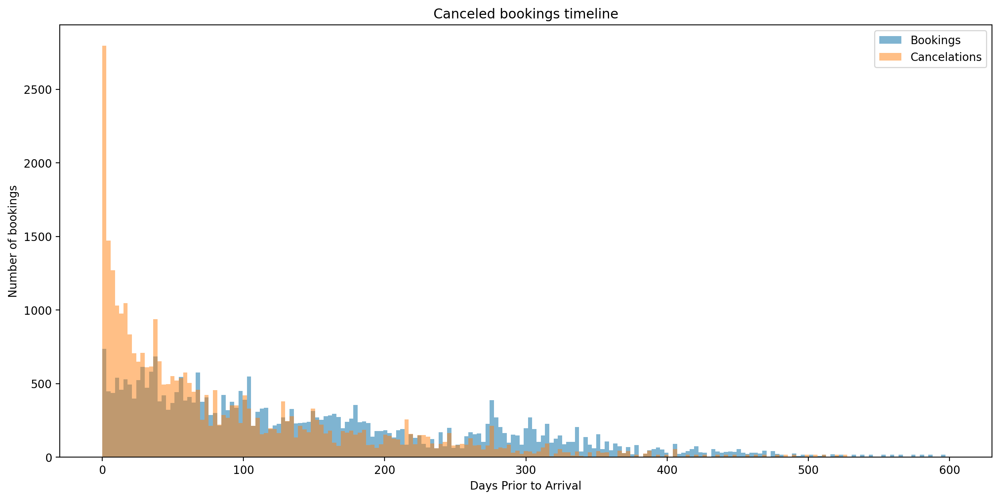

In [73]:
plt.style.use('default')
plt.style.use('tableau-colorblind10')


fig, axes = plt.subplots(1, 1, figsize=(15, 7))

x = df_cancelations['LeadTime']
y = df_cancelations['CancelationTime']

bins = np.linspace(0, 600, 200)

plt.hist(x, bins, alpha=0.5, label='Bookings')
plt.hist(y, bins, alpha=0.5, label='Cancelations')
plt.legend(loc='upper right')
plt.xlabel('Days Prior to Arrival')
plt.ylabel('Number of bookings')
plt.title('Canceled bookings timeline')
plt.show()

<hr>
<a class="anchor" id="6.">
    
# 6. Final Checks
    
</a>


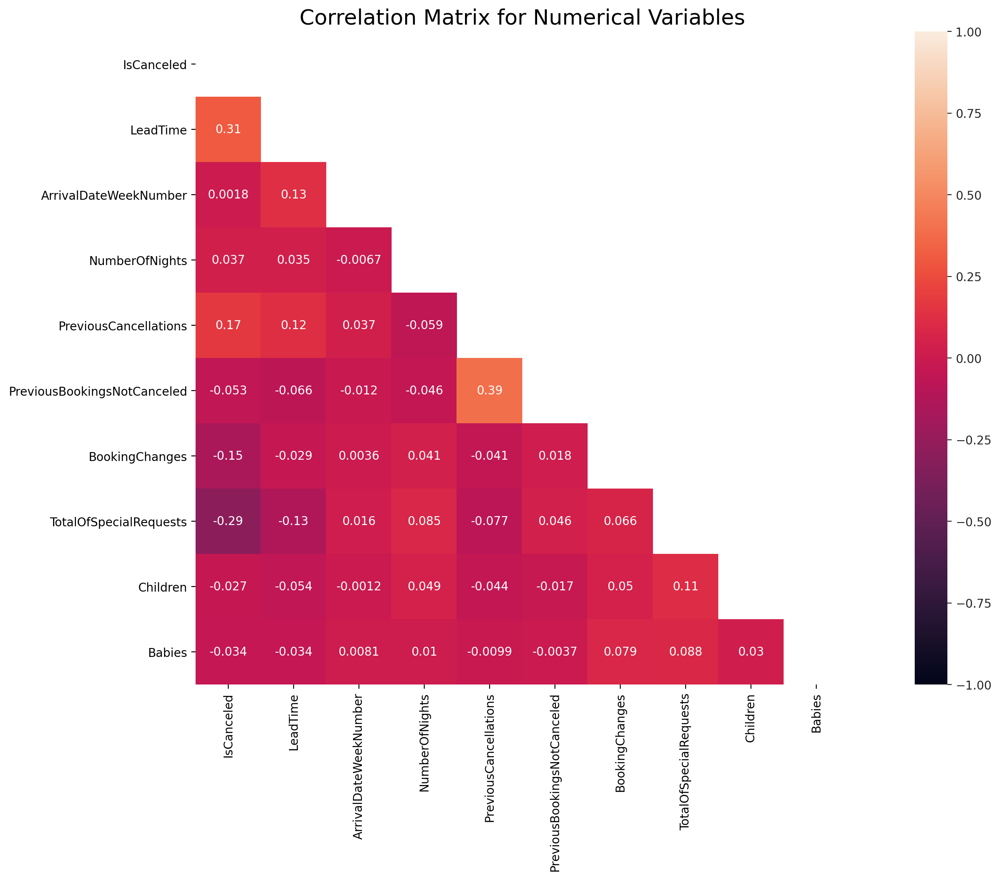

In [74]:
fig, axes = plt.subplots(1, 1, figsize=(20, 10))

mask = np.zeros_like(df[['IsCanceled'] + selected_metric_features].corr(method="pearson"), dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

with sns.axes_style("white"):
  ax = sns.heatmap(df[['IsCanceled'] + selected_metric_features].corr(method="pearson"),vmin=-1, vmax=1, square=True, annot=True, mask=mask)

plt.title('Correlation Matrix for Numerical Variables', fontsize=18)
plt.show()


interval columns not set, guessing: ['IsCanceled', 'LeadTime', 'ArrivalDateWeekNumber', 'NumberOfNights', 'PreviousCancellations', 'PreviousBookingsNotCanceled', 'BookingChanges', 'TotalOfSpecialRequests', 'Babies']


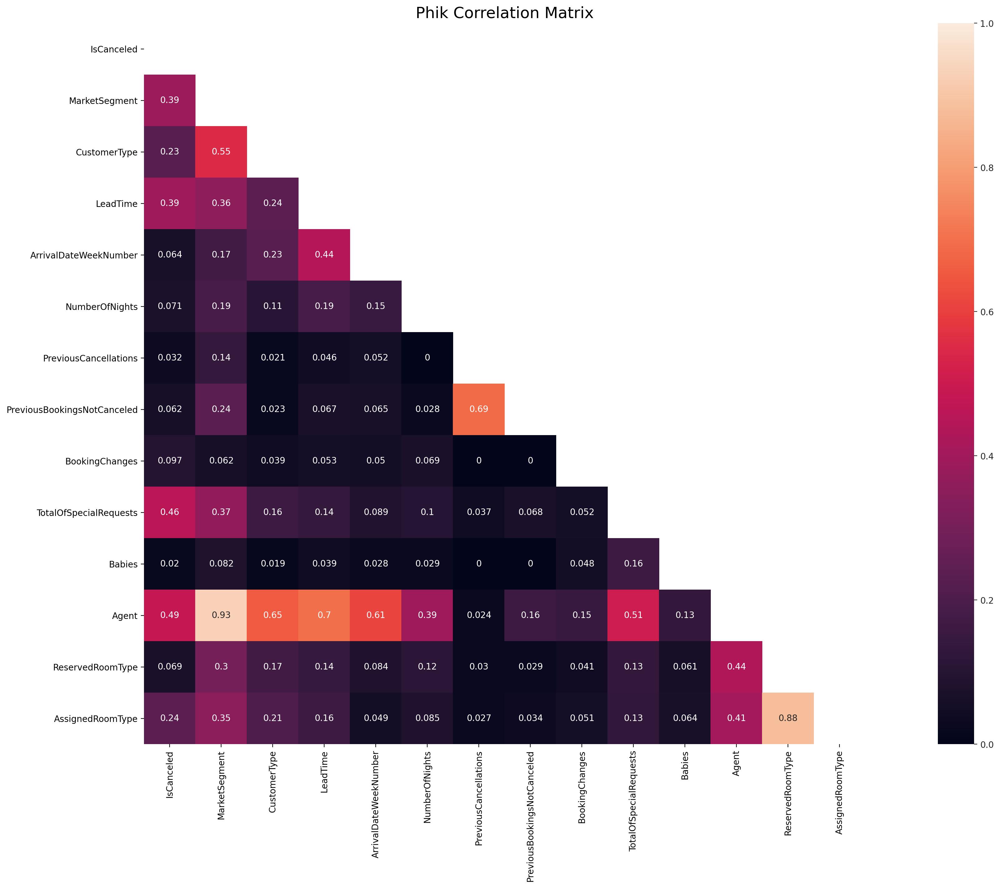

In [75]:
import phik
phik_matrix = df[['IsCanceled'] + feature_selection].phik_matrix()
fig, axes = plt.subplots(1, 1, figsize=(30, 15))

mask = np.zeros_like(phik_matrix, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

with sns.axes_style("white"):
  ax = sns.heatmap(phik_matrix,vmin=0, vmax=1, square=True, annot=True, mask=mask)

plt.title('Phik Correlation Matrix', fontsize=18)
plt.show()

<hr>
<a class="anchor" id="7.">
    
# 7. Modelling
    
</a>

## Creating a Pipeline for testing
- With this pipeline we can define which variables to include, what encoding should be applied to the data and the scaling method. 
- The pipeline will apply a stratified train/test split using 80% of the data for testing.
- The classification report as well as the confusion matrix for both the train and validation can be printed.
- It will return the Recall of the chosen model based on the performance on the validation set.

#### Parameters:
- model: model to be used
- df: data frame with the data to use
- variables: which columns to include 
- target: target variable to predict
- encoding: can be 'one-hot' or 'label' encoding
- scaling: 'minmax' or 'standard'
- print_report: 'yes'or 'no'

In [76]:
#Function to test_model without cross-validation (for quick testing)
def test_model(model, df=df, variables=feature_selection, encoding='one-hot', scaling=0, random_state = 5, 
               target='IsCanceled', print_report='yes'):
    
    #Defining features to be used based on parameter variables
    X = df[variables]
    
    #Defining target
    y = df[target]
    
    
    #Encoding
    #One-hot encoding
    if encoding=='one-hot':
        X = pd.get_dummies(X)    
    #Label-encoding
    if encoding=='label':
        label = preprocessing.LabelEncoder()
        data_label_encoded = pd.DataFrame() 
        for i in df[selected_non_metric_features].columns:
            data_label_encoded[i]=label.fit_transform(df[selected_non_metric_features][i])
        X = pd.concat([data_label_encoded, data[metric_features]], axis=1)
        X = X[variables]
    
    #Defines model to be used
    model = model

    #Train-Test Split
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify = y, random_state=random_state)
        
    #Scaling 
    #MinMaxScaler
    if scaling=='minmax':
        included_metric_features = selected_metric_features
        #define the scaler
        scaler = MinMaxScaler()
        #scaling metric features both in the train and test data sets
        scaled_metric_feat_train = pd.DataFrame(scaler.fit_transform(X_train[included_metric_features]), 
                                                columns=included_metric_features, index=X_train.index)
        scaled_metric_feat_test = pd.DataFrame(scaler.fit_transform(X_test[included_metric_features]),
                                                      columns=included_metric_features, index=X_test.index)
        #Changing metric features in train and test to scaled
        for column in included_metric_features:
            X_train[column] = scaled_metric_feat_train[column]
            X_test[column] = scaled_metric_feat_test[column]
       
    #StandardScaler
    if scaling=='standard':
        included_metric_features = selected_metric_features
        #define the scaler
        scaler = StandardScaler()
        #scaling metric features both in the train and test data sets
        scaled_metric_feat_train = pd.DataFrame(scaler.fit_transform(X_train[included_metric_features]), 
                                                columns=included_metric_features, index=X_train.index)
        scaled_metric_feat_test = pd.DataFrame(scaler.fit_transform(X_test[included_metric_features]),
                                                      columns=included_metric_features, index=X_test.index)
        #Changing metric features in train and test to scaled
        for column in included_metric_features:
            X_train[column] = scaled_metric_feat_train[column]
            X_test[column] = scaled_metric_feat_test[column]
    
    #Fit model
    model.fit(X_train, y_train)

    #Make predictions
    y_pred_train = model.predict(X_train)
    y_pred_test = model.predict(X_test)
    expected_y_train = y_train
    expected_y_test = y_test
    
    #print classification report  
    if print_report=='yes':
        print('___________________________________________________________________________________________________________')
        print('                                                     TRAIN                                                 ')
        print('-----------------------------------------------------------------------------------------------------------')
        print(classification_report(expected_y_train, y_pred_train))
        print(confusion_matrix(expected_y_train, y_pred_train))


        print('___________________________________________________________________________________________________________')
        print('                                                VALIDATION                                                 ')
        print('-----------------------------------------------------------------------------------------------------------')
        print(classification_report(expected_y_test, y_pred_test))
        print(confusion_matrix(expected_y_test, y_pred_test))
    
    #return f1_score micro average
    return accuracy_score(y_test, y_pred_test), precision_score(y_test, y_pred_test), recall_score(y_test, y_pred_test)

In [77]:
def metrics(y_train, pred_train , y_val, pred_val):
    print('___________________________________________________________________________________________________________')
    print('                                                     TRAIN                                                 ')
    print('-----------------------------------------------------------------------------------------------------------')
    print(classification_report(y_train, pred_train))
    print(confusion_matrix(y_train, pred_train))


    print('___________________________________________________________________________________________________________')
    print('                                                VALIDATION                                                 ')
    print('-----------------------------------------------------------------------------------------------------------')
    print(classification_report(y_val, pred_val))
    print(confusion_matrix(y_val, pred_val))

##### Function with 10-Fold Cross Validation for confirming results

In [78]:
#function to test model with cross validation (for validating results)
def test_model_cv(model, data_train=df, variables=feature_selection, encoding='one-hot', scaling=0, 
               target='IsCanceled', print_report='yes', cv=10):
    
    #Defining features to be used based on parameter variables
    X = data_train[variables]
    
    #Defining target
    y = data_train[target]
    
    #Encoding
    #One-hot encoding
    if encoding=='one-hot':
        X = pd.get_dummies(X)    
    
    #Defines model to be used
    model = model

    #Cross-validation
    kf = KFold(n_splits=cv)
    score_train = []
    score_test = []
    timer = []
    conf_matrix_array = []
    for train_index, test_index in kf.split(X):
        # get the indexes of the observations assigned for each partition
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]
            
        
        #Scaling metric features
    
        #MinMaxScaler
        if scaling=='minmax':
            included_metric_features = selected_metric_features
            #define the scaler
            scaler = MinMaxScaler()
            #scaling metric features both in the train and test data sets
            scaled_metric_feat_train = pd.DataFrame(scaler.fit_transform(X_train[included_metric_features]), 
                                                columns=included_metric_features, index=X_train.index)
            scaled_metric_feat_test = pd.DataFrame(scaler.fit_transform(X_test[included_metric_features]),
                                                      columns=included_metric_features, index=X_test.index)
            #Changing metric features in train and test to scaled
            for column in included_metric_features:
                X_train[column] = scaled_metric_feat_train[column]
                X_test[column] = scaled_metric_feat_test[column]
       
        #StandardScaler
        if scaling=='standard':
            included_metric_features = selected_metric_features
            #define the scaler
            scaler = StandardScaler()
            #scaling metric features both in the train and test data sets
            scaled_metric_feat_train = pd.DataFrame(scaler.fit_transform(X_train[included_metric_features]), 
                                                columns=included_metric_features, index=X_train.index)
            scaled_metric_feat_test = pd.DataFrame(scaler.fit_transform(X_test[included_metric_features]),
                                                      columns=included_metric_features, index=X_test.index)
            #Changing metric features in train and test to scaled
            for column in included_metric_features:
                X_train[column] = scaled_metric_feat_train[column]
                X_test[column] = scaled_metric_feat_test[column]
       
        # start counting time
        begin = time.perf_counter()
        # fit the model to the data
        model.fit(X_train, y_train)
        # finish counting time
        end = time.perf_counter()
        # check the mean accuracy for the train
        value_train = accuracy_score(y_train, model.predict(X_train))
        # check the mean accuracy for the test
        value_test = accuracy_score(y_test,model.predict(X_test))
        #confusion matrix - disabled
        #conf_matrix = confusion_matrix(y_test, model.predict(X_test))
        # append the accuracies, the time, the number of iterations and conf matrix in the corresponding list
        score_train.append(value_train)
        score_test.append(value_test)
        timer.append(end-begin)
        #conf_matrix_array.append(conf_matrix) - disabled
    
    # calculate the average and the std for each measure (f1_score and time)
    avg_time = round(np.mean(timer),3)
    avg_train = round(np.mean(score_train),3)
    avg_test = round(np.mean(score_test),3)
    std_time = round(np.std(timer),2)
    std_train = round(np.std(score_train),2)
    std_test = round(np.std(score_test),2)
    
    #return data frame with avg running time and f1_score for train and test
    return pd.DataFrame([avg_time, avg_train, avg_test], index=(['avg_time', 'avg_train', 'avg_test']), 
                        columns=[str(model).split('(')[0]]).T

## Testing range of model candidates 


<hr>
<a class="anchor" id="7.1.">
    
# 7.1 Decision Tree
    
</a>

In [79]:
#Decision Tree
DT = DecisionTreeClassifier(max_depth=5)
DT_benchmark = test_model(DT, df=df, print_report='no')

<hr>
<a class="anchor" id="7.2.">
    
# 7.2 KNN
    
</a>

In [80]:
#KNN
KNN = KNeighborsClassifier()
KNN_benchmark = test_model(KNN, df=df, print_report='no')

<hr>
<a class="anchor" id="7.3.">
    
# 7.3 Logistic Regression     
</a>

In [81]:
#Logistic Regression
LR = LogisticRegression()
LR_benchmark = test_model(LR, df=df, print_report='no')

<hr>
<a class="anchor" id="7.4.">
    
# 7.4 Neural Network     
</a>

In [82]:
#Neural Network
NN = MLPClassifier()
NN_benchmark = test_model(NN, df=df, print_report='no')

<hr>
<a class="anchor" id="7.5.">
    
# 7.5 HGB
</a>

In [83]:
#Running a GreedSearch (this cell takes a long time to run)
hgb_pipe = HistGradientBoostingClassifier()

#parameters to tune
parameters = {"learning_rate" : [0.1,0.3,0.05,0.5],
              "max_iter" : [90,100,125], 
              "max_leaf_nodes": [28,31,33],
              "min_samples_leaf": [15,20,25], 
    }
#instantiate the gridsearch
hgb_grid = GridSearchCV(hgb_pipe, parameters, n_jobs=-1,  
 cv=5, scoring="f1_micro",
 verbose=2, refit=True)

#fit on the grid 
hgb_grid.fit(X_train, y_train)

hgb_grid.best_params_
gb1 = GradientBoostingClassifier(learning_rate= 0.5, 
                                 max_leaf_nodes= 31, 
                                 min_samples_leaf= 20, 
                                 random_state = 5)


In [84]:
HGB = HistGradientBoostingClassifier(scoring='accuracy', 
                                        max_depth=12, 
                                        min_samples_leaf=24,
                                        max_leaf_nodes=16,
                                        loss='binary_crossentropy',
                                        learning_rate = 0.1,
                                        random_state = 5
                                    )

HGB_benchmark = test_model(HGB, df=df, print_report='no')

<hr>
<a class="anchor" id="7.6.">
    
# 7.6 Random Forest
</a>

In [85]:
w= 2
regressor = RandomForestClassifier(n_estimators=125, random_state=0,bootstrap='true',
                                   class_weight={0:1},max_features='sqrt', max_depth= 35,
                                  min_samples_leaf=1, min_samples_split= 15 )
X = pd.get_dummies(df[feature_selection])
y = df['IsCanceled']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify = y)
regressor.fit(X_train, y_train)
y_forest_train= regressor.predict(X_train)
y_forest_val = regressor.predict(X_test)

In [86]:
metrics(y_train, y_forest_train, y_test, y_forest_val)

___________________________________________________________________________________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.87      0.94      0.90     36865
           1       0.91      0.80      0.85     26462

    accuracy                           0.88     63327
   macro avg       0.89      0.87      0.88     63327
weighted avg       0.88      0.88      0.88     63327

[[34672  2193]
 [ 5291 21171]]
___________________________________________________________________________________________________________
                                                VALIDATION                                                 
------------------------------------------------------------------------------------------------------

In [87]:
RF_benchmark = test_model(regressor, df=df, print_report='no')

<hr>
<a class="anchor" id="7.7.">
    
# 7.7 Adaboost
</a>

In [88]:
ADA = AdaBoostClassifier()

AdaBoost_benchmark = test_model(ADA, df=df, print_report='no')

<hr>
<a class="anchor" id="7.8.">
    
# 7.8 Gradient Boosting
</a>

In [89]:
gb = GradientBoostingClassifier(random_state = 5)

GB_benchmark = test_model(gb, df=df, print_report='no')

<hr>
<a class="anchor" id="7.8.">
    
# 7.9 LightGBM
</a>

In [134]:
#LightGBM

import numpy as np
from collections import Counter
import pandas as pd
import lightgbm as lgb
from sklearn.datasets import load_breast_cancer,load_boston,load_wine
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import mean_squared_error,roc_auc_score,precision_score,accuracy_score

feat_all_1 = ['LeadTime', 'ArrivalDateYear', 'ArrivalDateMonth',
       'ArrivalDateWeekNumber', 'ArrivalDateDayOfMonth',
       'StaysInWeekendNights', 'StaysInWeekNights', 'Adults', 'Children',
       'Babies', 'Meal', 'MarketSegment', 'DistributionChannel',
       'IsRepeatedGuest', 'PreviousCancellations',
       'PreviousBookingsNotCanceled', 'ReservedRoomType', 'AssignedRoomType',
       'BookingChanges', 'Agent', 'Company',
       'DaysInWaitingList', 'CustomerType', 'ADR', 'RequiredCarParkingSpaces',
       'TotalOfSpecialRequests','NumberOfNights']

feat_all = ['LeadTime',
       'ArrivalDateWeekNumber',
       'StaysInWeekendNights', 'StaysInWeekNights', 'Adults', 'Children',
       'Babies', 'Meal', 'MarketSegment',
       'IsRepeatedGuest', 'PreviousCancellations',
       'PreviousBookingsNotCanceled', 'ReservedRoomType',
       'BookingChanges', 'Agent',
       'DaysInWaitingList', 'CustomerType', 'ADR', 'RequiredCarParkingSpaces',
       'TotalOfSpecialRequests','NumberOfNights']

#dataset
X=pd.get_dummies(df[feat_all_1])
Y=df['IsCanceled']

#scaling the features using Standard Scaler
sc=StandardScaler()
sc.fit(X)
X=pd.DataFrame(sc.fit_transform(X))

#train_test_split 
X_train,X_test,y_train,y_test=train_test_split(X,Y,test_size=0.3,random_state=0)

#converting the dataset into proper LGB format 
d_train=lgb.Dataset(X_train, label=y_train)

#Specifying the parameter
params={}
params['learning_rate']=0.03
params['boosting_type']='gbdt' #GradientBoostingDecisionTree
params['objective']='binary' #Binary target feature
params['metric']='binary_logloss' #metric for binary classification
params['max_depth']=10

#train the model 
clf=lgb.train(params,d_train,100) #train the model on 100 epocs

#prediction on the test set
y_pred=clf.predict(X_test)

#Transform test probabilities into binary 
def pred(x):
    if x>0.4:
        return 1
    else:
        return 0

y_predict = pd.DataFrame(y_pred)
y_predict.rename(columns = {0: 'Prob'}, inplace=True)
y_predict['Pred'] = y_predict['Prob'].apply(pred) 
y_predict
y_pred = y_predict['Pred']

print('___________________________________________________________________________________________________________')
print('                                                VALIDATION                                                 ')
print('-----------------------------------------------------------------------------------------------------------')
print(classification_report(y_test, y_pred))
print(confusion_matrix(y_test, y_pred))

___________________________________________________________________________________________________________
                                                VALIDATION                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.86      0.85      0.85     14051
           1       0.79      0.79      0.79      9711

    accuracy                           0.83     23762
   macro avg       0.82      0.82      0.82     23762
weighted avg       0.83      0.83      0.83     23762

[[11965  2086]
 [ 2018  7693]]


Confusion matrix

 [[12364  1687]
 [ 2392  7319]]

True Positives(TP) =  12364

True Negatives(TN) =  7319

False Positives(FP) =  1687

False Negatives(FN) =  2392


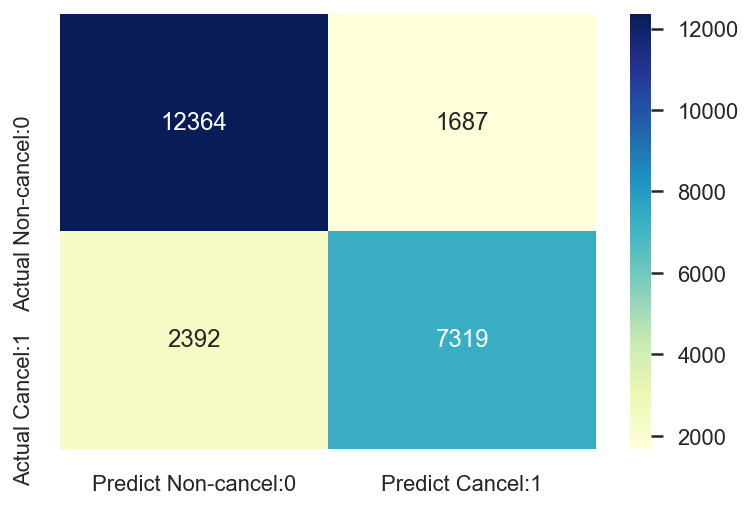

In [118]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, y_pred)
print('Confusion matrix\n\n', cm)
print('\nTrue Positives(TP) = ', cm[0,0])
print('\nTrue Negatives(TN) = ', cm[1,1])
print('\nFalse Positives(FP) = ', cm[0,1])
print('\nFalse Negatives(FN) = ', cm[1,0])

# visualize confusion matrix with seaborn heatmap

cm_matrix = pd.DataFrame(data=cm, columns=['Predict Non-cancel:0', 'Predict Cancel:1'], 
                                 index=['Actual Non-cancel:0', 'Actual Cancel:1'])

sns.heatmap(cm_matrix, annot=True, fmt='d', cmap='Blues')


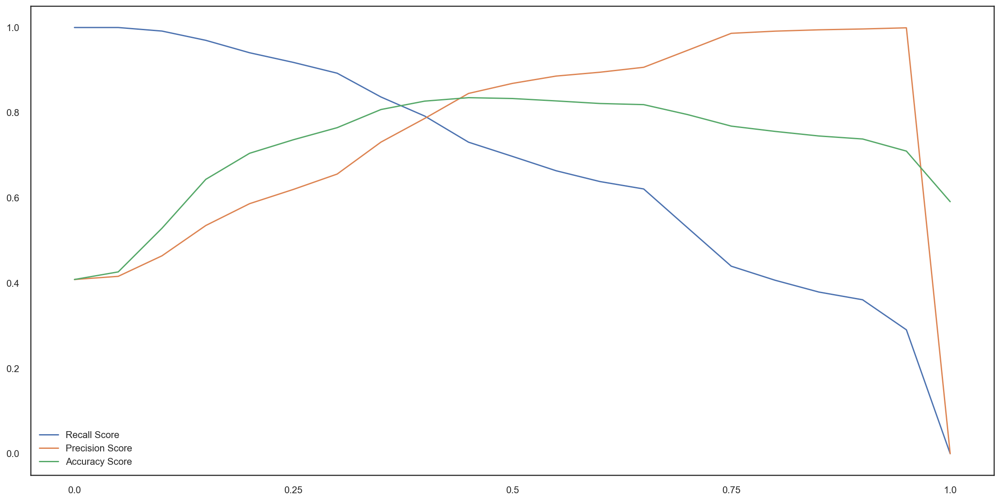

In [135]:
#LightGBM
#prediction on the test set
y_pred=clf.predict(X_test)

y_predict = pd.DataFrame(y_pred)
y_predict.rename(columns = {0: 'Prob'}, inplace=True)

#Transform test probabilities into binary 
recall_scores = []
precision_scores = []
accuracy = []

for n in np.linspace(0,1, 21):
    def pred(x):
        if x>n:
            return 1
        else:
            return 0   
    name = str(round(n, 2))
    y_predict[name] = y_predict['Prob'].apply(pred) 
    recall_scores.append(recall_score(y_test, y_predict[name]))
    precision_scores.append(precision_score(y_test, y_predict[name]))
    accuracy.append(accuracy_score(y_test, y_predict[name]))
sns.set(style="white")
y_predict



pd.DataFrame([recall_scores,precision_scores,accuracy], 
             index=['Recall Score','Precision Score','Accuracy Score'], 
             columns=y_predict.iloc[:, 1:].columns).T.plot(figsize=(20, 10), marker='o', linestyle='dashed',
                                                           linewidth=2, markersize=10)
plt.xlabel('Probability Threshold')
plt.ylabel('Score')
plt.title('Performance trade-off for alternative probability thresholds', size=18)

<hr>
<a class="anchor" id="7.8.">
    
# 7.10 CatBoost
</a>

In [90]:
#GRIDSEARCH FOR CATBOOST
params = {'depth':[3,1,2,6,4,5,7,8,9,10],
          'iterations':[250,100,500,1000],
          'learning_rate':[0.03,0.001,0.01,0.1,0.2,0.3], 
          'l2_leaf_reg':[3,1,5,10,100],
          'border_count':[32,5,10,20,50,100,200],
          'ctr_border_count':[50,5,10,20,100,200],
          'thread_count':4}

_________________________________________________________________________________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.89      0.90      0.90     36865
           1       0.90      0.89      0.90     36865

    accuracy                           0.90     73730
   macro avg       0.90      0.90      0.90     73730
weighted avg       0.90      0.90      0.90     73730

[[33347  3518]
 [ 3999 32866]]
_________________________________________________________________________________________________________
                                                VALIDATION                                                 
----------------------------------------------------------------------------------------------------------

<AxesSubplot:>

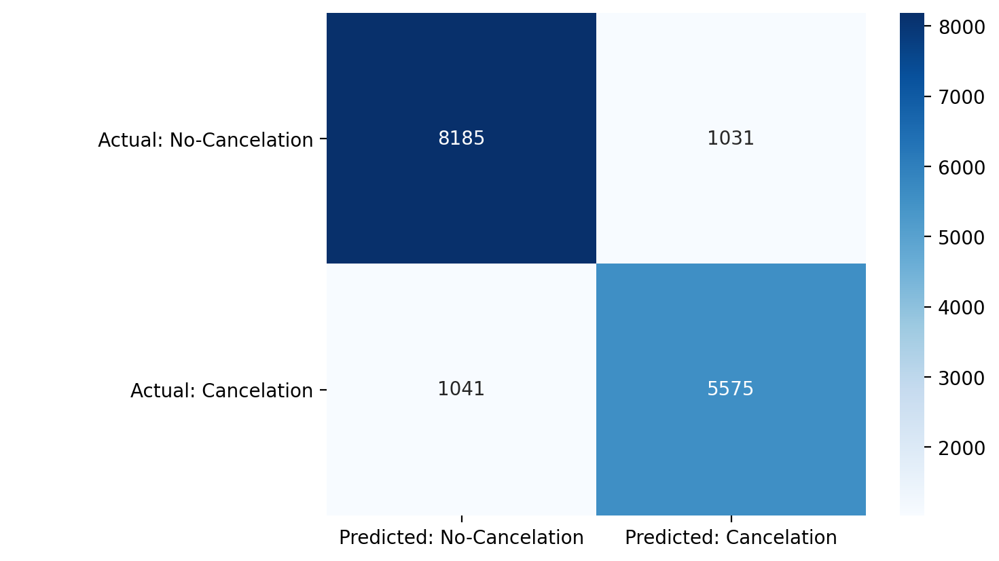

In [91]:
#Running Model using SMOTE (Oversampling technique)

X = pd.get_dummies(df.drop(columns=['ReservationStatus', 'ReservationStatusDate', 'IsCanceled',
                                   'ArrivalDateYear', 'ArrivalDateMonth', 'ArrivalDateDayOfMonth',
                                   'StaysInWeekendNights', 'StaysInWeekNights', 'Adults',
                                   'TotalGuests', 'Meal', 'IsRepeatedGuest',
                                    'DaysInWaitingList', 'ADR']))
y = df['IsCanceled']

#Model 
catboost_smote = CatBoostClassifier()

#Train_test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify = y, random_state=5)

#SMOTE
sm = SMOTE()
X_train_res, y_train_res = sm.fit_sample(X_train, y_train)

#Fit Model
catboost_smote.fit(X_train_res, y_train_res, silent=True)

#Make predictions
y_pred_train = catboost_smote.predict(X_train_res)
y_pred_test = catboost_smote.predict(X_test)
expected_y_train = y_train_res
expected_y_test = y_test

print('_________________________________________________________________________________________________________')
print('                                                     TRAIN                                                 ')
print('-----------------------------------------------------------------------------------------------------------')
print(classification_report(expected_y_train, y_pred_train))
print(confusion_matrix(expected_y_train, y_pred_train))


print('_________________________________________________________________________________________________________')
print('                                                VALIDATION                                                 ')
print('-----------------------------------------------------------------------------------------------------------')
print(classification_report(expected_y_test, y_pred_test))
cm=confusion_matrix(expected_y_test, y_pred_test)
# visualize confusion matrix with seaborn heatmap
cm_matrix = pd.DataFrame(data=cm, columns=['Predicted: No-Cancelation', 'Predicted: Cancelation'], 
                                 index=['              Actual: No-Cancelation', 'Actual: Cancelation'])

sns.heatmap(cm_matrix, annot=True, fmt='d', cmap='Blues')

Text(0.5, 1.0, 'Performance trade-off for alternative probability thresholds')

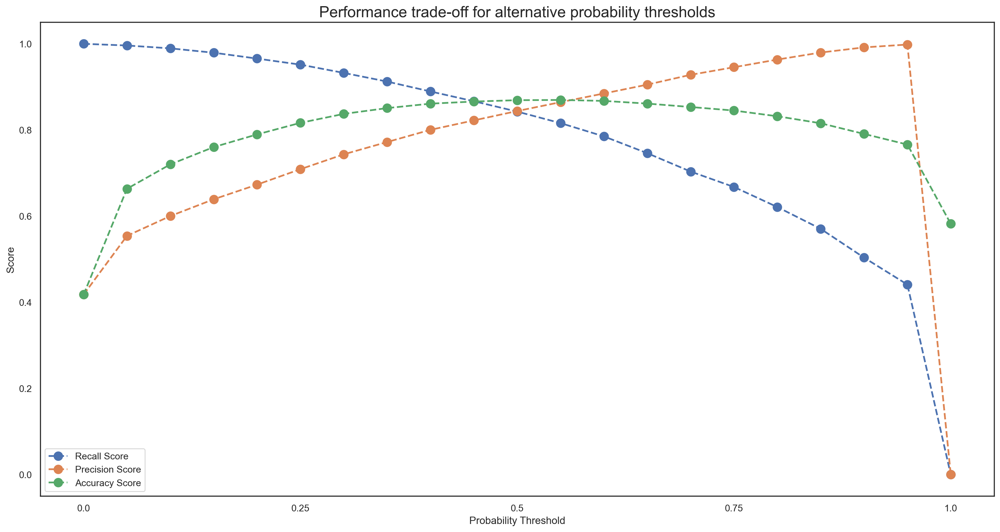

In [92]:
#prediction on the test set
y_pred=catboost_smote.predict_proba(X_test)

y_predict = pd.DataFrame(y_pred)
y_predict.rename(columns = {1: 'Prob'}, inplace=True)

#Transform test probabilities into binary 
recall_scores = []
precision_scores = []
accuracy = []

for n in np.linspace(0,1, 21):
    def pred(x):
        if x>n:
            return 1
        else:
            return 0   
    name = str(round(n, 2))
    y_predict[name] = y_predict['Prob'].apply(pred) 
    recall_scores.append(recall_score(expected_y_test, y_predict[name]))
    precision_scores.append(precision_score(expected_y_test, y_predict[name]))
    accuracy.append(accuracy_score(expected_y_test, y_predict[name]))
sns.set(style="white")
y_predict



pd.DataFrame([recall_scores,precision_scores,accuracy], 
             index=['Recall Score','Precision Score','Accuracy Score'], 
             columns=y_predict.iloc[:, 2:].columns).T.plot(figsize=(20, 10), marker='o', linestyle='dashed',
                                                           linewidth=2, markersize=10)
plt.xlabel('Probability Threshold')
plt.ylabel('Score')
plt.title('Performance trade-off for alternative probability thresholds', size=18)
#plt.hlines(y=0.88, xmin=0, xmax=20, color="r", linewidth=1, linestyle='dashed',
           #label="cut-off region")


<hr>
<a class="anchor" id="7.8.">
    
# 7.11 Summary of results
</a>

Text(0.5, 0, 'Models Tested')

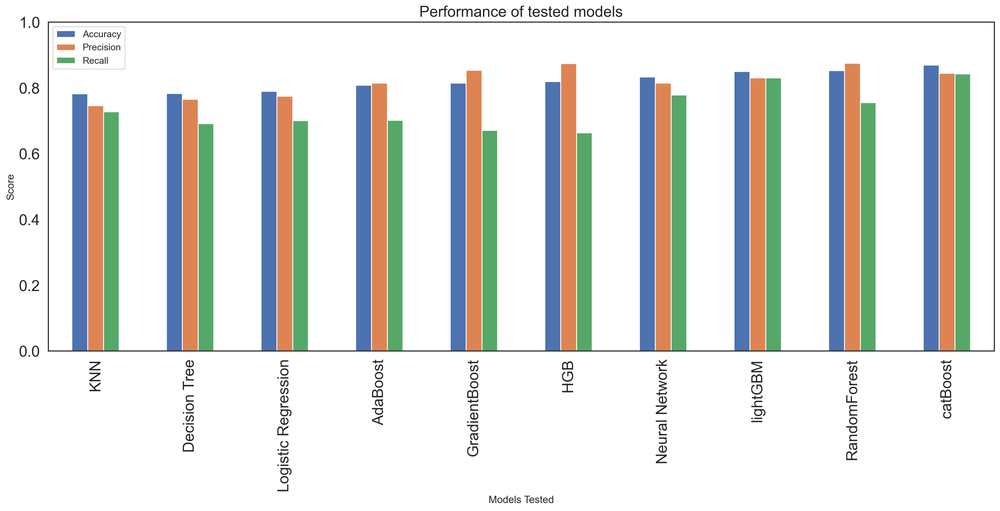

In [93]:
model_candidates = ['Decision Tree', 'Neural Network', 'Logistic Regression', 'KNN', 
                    'HGB','AdaBoost','GradientBoost', 
                    'RandomForest', 'lightGBM', 'catBoost']

model_candidates_accuracy = [DT_benchmark[0], NN_benchmark[0], LR_benchmark[0], KNN_benchmark[0], 
                             HGB_benchmark[0], AdaBoost_benchmark[0], GB_benchmark[0],
                             RF_benchmark[0], 0.85, accuracy_score(expected_y_test, y_pred_test)]
                             
model_candidates_precision = [DT_benchmark[1], NN_benchmark[1], LR_benchmark[1], KNN_benchmark[1], 
                             HGB_benchmark[1], AdaBoost_benchmark[1], GB_benchmark[1],
                             RF_benchmark[1], 0.83, precision_score(expected_y_test, y_pred_test)]

model_candidates_recall = [DT_benchmark[2], NN_benchmark[2], LR_benchmark[2], KNN_benchmark[2], 
                             HGB_benchmark[2], AdaBoost_benchmark[2], GB_benchmark[2],
                             RF_benchmark[2], 0.83, recall_score(expected_y_test, y_pred_test)]

pd.DataFrame([model_candidates_accuracy, model_candidates_precision, model_candidates_recall], 
             index=['Accuracy', 'Precision', 'Recall'], 
             columns=model_candidates).T.sort_values(by='Accuracy').plot(kind='bar', 
                                                                   figsize=(20, 7), 
                                                                   ylim=(0, 1), 
                                                                   fontsize=(18))
plt.title('Performance of tested models', size=18)
plt.ylabel('Score')
plt.xlabel('Models Tested')

# Implementation and Model Deployment

### Creating a Visualisation for Net Demand Forecasting

_________________________________________________________________________________________________________
                                                TEST                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.90      0.90      0.90     46081
           1       0.86      0.86      0.86     33078

    accuracy                           0.88     79159
   macro avg       0.88      0.88      0.88     79159
weighted avg       0.88      0.88      0.88     79159



<AxesSubplot:>

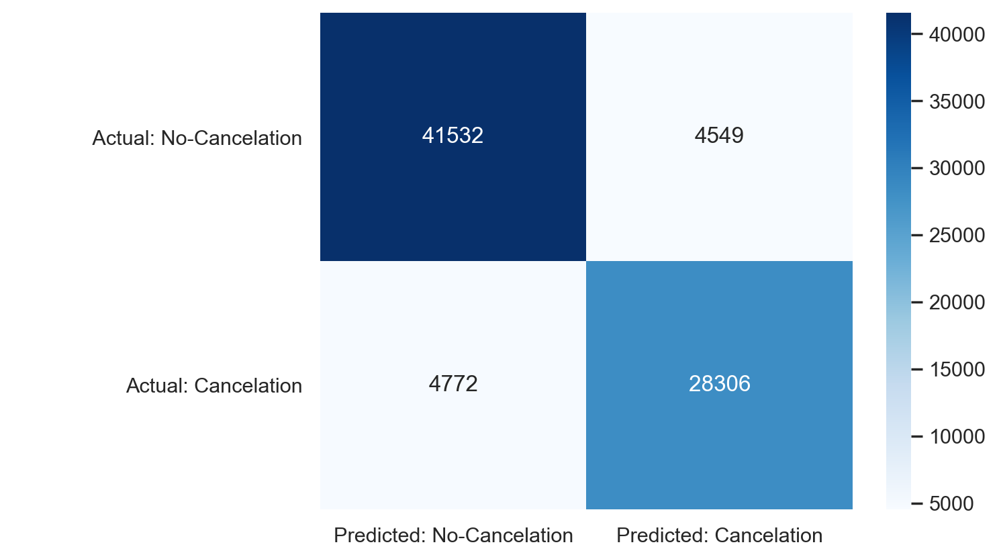

In [94]:
X = pd.get_dummies(df.drop(columns=['ReservationStatus', 'ReservationStatusDate', 'IsCanceled',
                                   'ArrivalDateYear', 'ArrivalDateMonth', 'ArrivalDateDayOfMonth',
                                   'StaysInWeekendNights', 'StaysInWeekNights', 'Adults',
                                   'TotalGuests', 'Meal', 'IsRepeatedGuest',
                                    'DaysInWaitingList', 'ADR']))
#Make predictions
Prediction = catboost_smote.predict(X)
expected_y_2017 = df['IsCanceled']

print('_________________________________________________________________________________________________________')
print('                                                TEST                                                 ')
print('-----------------------------------------------------------------------------------------------------------')
print(classification_report(expected_y_2017, Prediction))

cm=confusion_matrix(expected_y_2017, Prediction)
# visualize confusion matrix with seaborn heatmap
cm_matrix = pd.DataFrame(data=cm, columns=['Predicted: No-Cancelation', 'Predicted: Cancelation'], 
                                 index=['              Actual: No-Cancelation', 'Actual: Cancelation'])

sns.heatmap(cm_matrix, annot=True, fmt='d', cmap='Blues')

In [95]:
df_PowerBI = df.copy()
df_PowerBI['CancelationDate'] = pd.to_datetime(df_PowerBI['ReservationStatusDate'])
df_PowerBI['ArrivalDateYear'] = df_PowerBI['ArrivalDateYear'].astype('str')
df_PowerBI['ArrivalDateMonth'] = df_PowerBI['ArrivalDateMonth'].apply(month_to_number)
df_PowerBI['ArrivalDateMonth'] = df_PowerBI['ArrivalDateMonth'].astype('str')
df_PowerBI['ArrivalDateDayOfMonth'] = df_PowerBI['ArrivalDateDayOfMonth'].astype('str')
df_PowerBI['ArrivalDateMonth'] = df_PowerBI['ArrivalDateMonth'].apply(add_0)
df_PowerBI['ArrivalDateDayOfMonth'] = df_PowerBI['ArrivalDateDayOfMonth'].apply(add_0)
df_PowerBI['ArrivalDate'] = df_PowerBI['ArrivalDateYear']+'-'+df_PowerBI['ArrivalDateMonth']+'-'+df_PowerBI['ArrivalDateDayOfMonth']
df_PowerBI['ArrivalDate'] = pd.to_datetime(df_PowerBI['ArrivalDate'])
df_PowerBI['CancelationTime'] = df_PowerBI['ArrivalDate']-df_PowerBI['CancelationDate']
df_PowerBI['LeadTimeDelta'] = df_PowerBI['LeadTime'].apply(timedelta)
df_PowerBI['BookingDate'] = df_PowerBI['ArrivalDate'] - df_PowerBI['LeadTimeDelta']
df_PowerBI['BookingToCancelationTime'] = df_PowerBI['CancelationDate'] - df_PowerBI['BookingDate']
df_PowerBI['LeadTime'] = df_PowerBI['ArrivalDate'] - df_PowerBI['BookingDate']
df_PowerBI['LeadTime'] = df_PowerBI['LeadTime'].dt.days
df_PowerBI['BookingToCancelationTime'] = df_PowerBI['BookingToCancelationTime'].dt.days
df_PowerBI['CancelationTime'] = df_PowerBI['CancelationTime'].dt.days
df_PowerBI = df_PowerBI.drop(columns=['LeadTimeDelta'])
df_PowerBI['ArrivalDateYear'] = df_PowerBI['ArrivalDateYear'].astype('int')
df_NetDemand = df_PowerBI
df_NetDemand['Prediction'] = Prediction


In [96]:
df_NetDemand = df_NetDemand[df_NetDemand['ArrivalDateYear']==2017][['ArrivalDate', 'NumberOfNights', 'IsCanceled', 'Prediction']]

In [97]:
df_NetDemand = df_NetDemand.groupby('ArrivalDate').agg({'NumberOfNights': 'count', 
                                                        'IsCanceled': 'sum', 
                                                        'Prediction': 'sum'})

In [98]:
df_NetDemand.rename(columns={'NumberOfNights': 'GrossDemand',
                            'IsCanceled': 'NetDemand',
                            'Prediction': 'ForecastedNetDemand'}, inplace=True)
df_NetDemand['NetDemand'] =  df_NetDemand['GrossDemand'] - df_NetDemand['NetDemand']
df_NetDemand['NetDemandForecast'] =  df_NetDemand['GrossDemand'] - df_NetDemand['ForecastedNetDemand']

In [99]:
#df_NetDemand.to_csv('/Users/rui.soromenho/Downloads/BC2_HotelCancelations_NetDemand')


Text(0.5, 1.0, 'Net Demand Forecast Prototype: Week 1, January 2017')

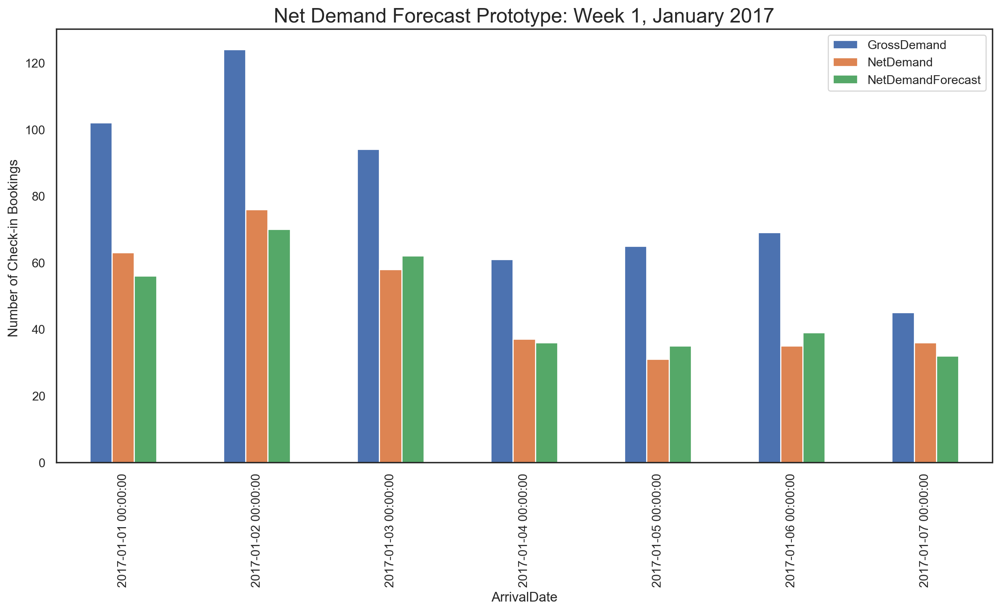

In [100]:
df_NetDemand = df_NetDemand[['GrossDemand', 'NetDemand', 'NetDemandForecast']]
df_NetDemand.iloc[:7,:].plot(kind='bar', figsize=(15, 7))
plt.ylabel('Number of Check-in Bookings ')
plt.title('Net Demand Forecast Prototype: Week 1, January 2017', size=18)

### Using 2015-2016 data to predict 2017

In [101]:
df_forecast = pd.read_csv('/Users/rui.soromenho/Downloads/BC2/BC2_predicting_cancellations/H2.csv')

In [102]:
df_forecast.columns

Index(['IsCanceled', 'LeadTime', 'ArrivalDateYear', 'ArrivalDateMonth',
       'ArrivalDateWeekNumber', 'ArrivalDateDayOfMonth',
       'StaysInWeekendNights', 'StaysInWeekNights', 'Adults', 'Children',
       'Babies', 'Meal', 'Country', 'MarketSegment', 'DistributionChannel',
       'IsRepeatedGuest', 'PreviousCancellations',
       'PreviousBookingsNotCanceled', 'ReservedRoomType', 'AssignedRoomType',
       'BookingChanges', 'DepositType', 'Agent', 'Company',
       'DaysInWaitingList', 'CustomerType', 'ADR', 'RequiredCarParkingSpaces',
       'TotalOfSpecialRequests', 'ReservationStatus', 'ReservationStatusDate'],
      dtype='object')

In [103]:
#df_forecast.drop(columns=['DepositType'], inplace=True)
df_forecast['NumberOfNights'] = df_forecast['StaysInWeekendNights'] + df_forecast['StaysInWeekNights']
df_forecast['TotalRevenue'] = df_forecast['ADR'] * df_forecast['NumberOfNights']

In [104]:
df_PowerBI = df_forecast.copy()
df_PowerBI['CancelationDate'] = pd.to_datetime(df_PowerBI['ReservationStatusDate'])
df_PowerBI['ArrivalDateYear'] = df_PowerBI['ArrivalDateYear'].astype('str')
df_PowerBI['ArrivalDateMonth'] = df_PowerBI['ArrivalDateMonth'].apply(month_to_number)
df_PowerBI['ArrivalDateMonth'] = df_PowerBI['ArrivalDateMonth'].astype('str')
df_PowerBI['ArrivalDateDayOfMonth'] = df_PowerBI['ArrivalDateDayOfMonth'].astype('str')
df_PowerBI['ArrivalDateMonth'] = df_PowerBI['ArrivalDateMonth'].apply(add_0)
df_PowerBI['ArrivalDateDayOfMonth'] = df_PowerBI['ArrivalDateDayOfMonth'].apply(add_0)
df_PowerBI['ArrivalDate'] = df_PowerBI['ArrivalDateYear']+'-'+df_PowerBI['ArrivalDateMonth']+'-'+df_PowerBI['ArrivalDateDayOfMonth']
df_PowerBI['ArrivalDate'] = pd.to_datetime(df_PowerBI['ArrivalDate'])
df_PowerBI['CancelationTime'] = df_PowerBI['ArrivalDate']-df_PowerBI['CancelationDate']
df_PowerBI['LeadTimeDelta'] = df_PowerBI['LeadTime'].apply(timedelta)
df_PowerBI['BookingDate'] = df_PowerBI['ArrivalDate'] - df_PowerBI['LeadTimeDelta']
df_PowerBI['BookingToCancelationTime'] = df_PowerBI['CancelationDate'] - df_PowerBI['BookingDate']
df_PowerBI['LeadTime'] = df_PowerBI['ArrivalDate'] - df_PowerBI['BookingDate']
df_PowerBI['LeadTime'] = df_PowerBI['LeadTime'].dt.days
df_PowerBI['BookingToCancelationTime'] = df_PowerBI['BookingToCancelationTime'].dt.days
df_PowerBI['CancelationTime'] = df_PowerBI['CancelationTime'].dt.days
df_PowerBI = df_PowerBI.drop(columns=['LeadTimeDelta'])
df_PowerBI['ArrivalDateYear'] = df_PowerBI['ArrivalDateYear'].astype('int')

df_forecast = df_PowerBI
df_forecast.columns

Index(['IsCanceled', 'LeadTime', 'ArrivalDateYear', 'ArrivalDateMonth',
       'ArrivalDateWeekNumber', 'ArrivalDateDayOfMonth',
       'StaysInWeekendNights', 'StaysInWeekNights', 'Adults', 'Children',
       'Babies', 'Meal', 'Country', 'MarketSegment', 'DistributionChannel',
       'IsRepeatedGuest', 'PreviousCancellations',
       'PreviousBookingsNotCanceled', 'ReservedRoomType', 'AssignedRoomType',
       'BookingChanges', 'DepositType', 'Agent', 'Company',
       'DaysInWaitingList', 'CustomerType', 'ADR', 'RequiredCarParkingSpaces',
       'TotalOfSpecialRequests', 'ReservationStatus', 'ReservationStatusDate',
       'NumberOfNights', 'TotalRevenue', 'CancelationDate', 'ArrivalDate',
       'CancelationTime', 'BookingDate', 'BookingToCancelationTime'],
      dtype='object')

In [105]:
df_forecast['ArrivalDateYear'].value_counts()

2016    38140
2017    27508
2015    13682
Name: ArrivalDateYear, dtype: int64

In [106]:
df_forecast['Country'] = df_forecast['Country'].fillna(df_forecast['Country'].mode)
df_forecast['Children'] = df_forecast['Children'].fillna(df_forecast['Children'].mode)
df_forecast['Country'] = df_forecast['Country'].astype('str')

In [107]:
df_forecast_encoded = pd.get_dummies(df_forecast[feature_selection + ['ArrivalDateYear']])

In [108]:
df_test = df_forecast[df_forecast['ArrivalDateYear']==2017]
df_train = df_forecast[df_forecast['ArrivalDateYear']!=2017]

In [109]:
df_test_encoded = df_forecast_encoded[df_forecast_encoded['ArrivalDateYear']==2017].drop(columns='ArrivalDateYear')
df_train_encoded = df_forecast_encoded[df_forecast_encoded['ArrivalDateYear']!=2017].drop(columns='ArrivalDateYear')

_________________________________________________________________________________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.86      0.93      0.89     24328
           1       0.92      0.85      0.88     24328

    accuracy                           0.89     48656
   macro avg       0.89      0.89      0.89     48656
weighted avg       0.89      0.89      0.89     48656

[[22630  1698]
 [ 3747 20581]]
_________________________________________________________________________________________________________
                                                VALIDATION                                                 
----------------------------------------------------------------------------------------------------------

<AxesSubplot:>

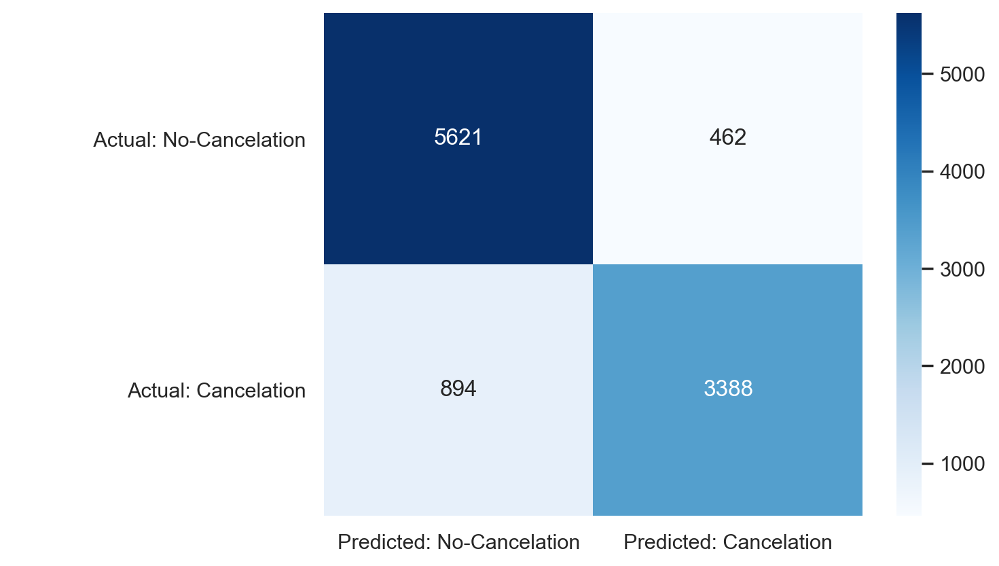

In [110]:
from catboost import CatBoostClassifier

X = df_train_encoded
y = df_train['IsCanceled']

#Model 
catboost_smote = CatBoostClassifier()

#Train_test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify = y, random_state=5)

#SMOTE
sm = SMOTE()
X_train_res, y_train_res = sm.fit_sample(X_train, y_train)

#Fit Model
catboost_smote.fit(X_train_res, y_train_res, silent=True)

#Make predictions
y_pred_train = catboost_smote.predict(X_train_res)
y_pred_test = catboost_smote.predict(X_test)
expected_y_train = y_train_res
expected_y_test = y_test

print('_________________________________________________________________________________________________________')
print('                                                     TRAIN                                                 ')
print('-----------------------------------------------------------------------------------------------------------')
print(classification_report(expected_y_train, y_pred_train))
print(confusion_matrix(expected_y_train, y_pred_train))


print('_________________________________________________________________________________________________________')
print('                                                VALIDATION                                                 ')
print('-----------------------------------------------------------------------------------------------------------')
print(classification_report(expected_y_test, y_pred_test))
cm=confusion_matrix(expected_y_test, y_pred_test)
# visualize confusion matrix with seaborn heatmap
cm_matrix = pd.DataFrame(data=cm, columns=['Predicted: No-Cancelation', 'Predicted: Cancelation'], 
                                 index=['              Actual: No-Cancelation', 'Actual: Cancelation'])

sns.heatmap(cm_matrix, annot=True, fmt='d', cmap='Blues')

_________________________________________________________________________________________________________
                                                TEST                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.75      0.86      0.80     15817
           1       0.77      0.62      0.68     11691

    accuracy                           0.76     27508
   macro avg       0.76      0.74      0.74     27508
weighted avg       0.76      0.76      0.75     27508



<AxesSubplot:>

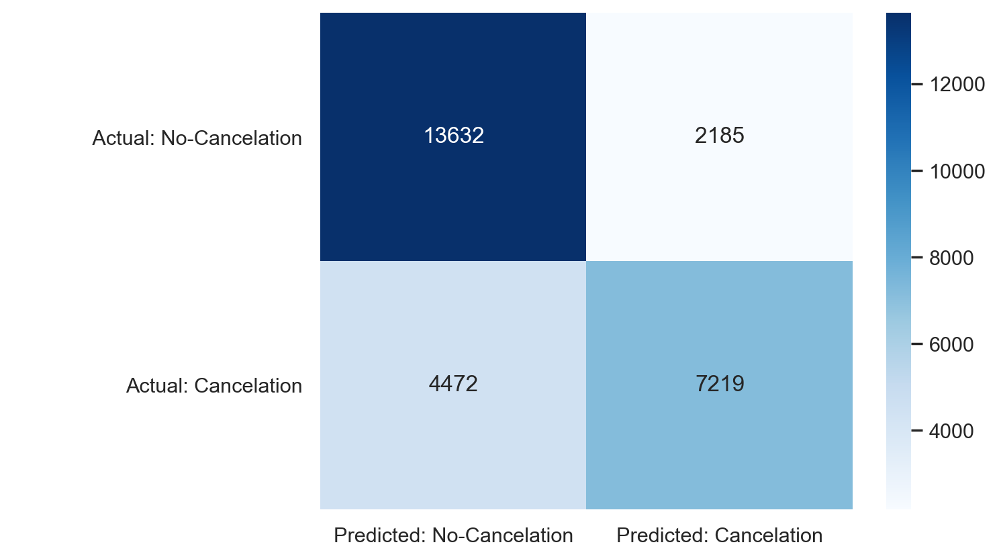

In [111]:
#Make predictions
y_pred_2017 = catboost_smote.predict(df_test_encoded)
expected_y_2017 = df_test['IsCanceled']

print('_________________________________________________________________________________________________________')
print('                                                TEST                                                 ')
print('-----------------------------------------------------------------------------------------------------------')
print(classification_report(expected_y_2017, y_pred_2017))

cm=confusion_matrix(expected_y_2017, y_pred_2017)
# visualize confusion matrix with seaborn heatmap
cm_matrix = pd.DataFrame(data=cm, columns=['Predicted: No-Cancelation', 'Predicted: Cancelation'], 
                                 index=['              Actual: No-Cancelation', 'Actual: Cancelation'])

sns.heatmap(cm_matrix, annot=True, fmt='d', cmap='Blues')